In [1]:
library(devtools)
library(ggridges)
library(dplyr)
library(tidyr)
library(ggplot2)
library(quantmod)
library(xts)
library(zoo)
library(gridExtra)
library(tibble)

set.seed(1)
load_all("../../../hmmTMB")
source("markets_functions.R")  # adjust path if the notebook’s cwd differs

Loading required package: usethis


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: xts

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



######################### Warning from 'xts' package ##########################
#                                                                             #
# The dplyr lag() function breaks how base R's lag() function is supposed to  #
# work, which breaks lag(my_xts). Calls to lag(my_xts) that you type or       #
# source() into this session won't work correctly.                            #
#                                                                             #
# Use stats::lag() to make sure you're not using dplyr::lag(), or you can add #
# conflictRules('dplyr', ex

In [9]:
run_hmm_analysis <- function(
  observation,
  obs_train,
  obs_test,
  cov_train,
  cov_test,
  hidden_states = 3,
  hid_formula = as.formula("~1"),
  horseshoe = FALSE,
  plot_folder = "tsx_only_plots"
) {
  source("markets_functions.R")

  plot_train_test_samples(
    obs_train = obs_train,
    obs_test = obs_test,
    y_column = "TSX_Composite",
    savefig = file.path(plot_folder, "train_test_samples.png")
  )

  # Step one: Create working parameters via log link
  obs_train_log <- lapply(obs_train, function(x) ln_transform(x))
  obs_test_log <- lapply(1:length(obs_test),  function(i) ln_transform(
      obs_test[[i]], previous_row = tail(obs_train[[i]], 1)
    )
  )

  n_samples <- length(obs_train_log)
  n_forecasts <- nrow(obs_test_log[[1]])

  for (i in 1:n_samples) {
    plot_train_test_zoomed(
      train_data = obs_train[[i]],
      test_data = obs_test[[i]],
      observation = observation,
      zoom_range = n_forecasts + 10,
      title = paste0("Train/Test Zoomed - Sample ", i),
      savefig = paste0(plot_folder, "/train_test_zoomed_sample_", i, ".png")
    )
  }

  hmms <- lapply(1:n_samples, function(i) {
    fit_markets_hmm(
      data = cbind(obs_train_log[[i]], cov_train[[i]]),
      n_states = hidden_states,
      obs_name = observation,
      hid_formula = hid_formula,
      horseshoe = horseshoe
    )
  })

  for (i in 1:n_samples) {
    plot_tsx_state_overview(
      hmm         = hmms[[i]],             # fitted HMM object
      train_data  = obs_train[[i]],      # data used to fit the model (needs Date + TSX_Composite)
      observation = "TSX_Composite", # defaults to this, change if you need another series
      show        = "both",          # options: "both", "states", "interval"
      title       = paste0("3 State model, sample ", i),  # optional heading
      savefig     = paste0(plot_folder, "/tsx_state_overview_sample_", i, ".png")
    )
  }

  forecasts <- lapply(1:n_samples, function(n) {
    hmm <- hmms[[n]]
    forecast <- hmmTMB::Forecast$new(
      hmm,
      n = n_forecasts,
      forecast_data = cov_test[[n]],
      preset_eval_range = list(TSX_Composite=seq(-0.05, 0.05, by = 0.001))
    )
  })
  forecast_eval_range <- lapply(forecasts, function(forecast) {
    forecast$eval_range()[[observation]]
  })
  forecast_dists <- lapply(forecasts, function(forecast) {
    forecast$forecast_dists()[[observation]]
  })
  forecast_dists_normalized <- lapply(seq(1:n_samples), function(n) {
    apply(forecast_dists[[n]], 2, function(col) col / sum(col))
  })

  for (n in 1:n_samples) {
    plot_ridge_data(
      # Timesteps ahead to be plotted
      forecast_timesteps = seq(60, n_forecasts, by=20),
      forecast_steps = forecast_eval_range[[n]],
      forecast_data = forecast_dists[[n]],
      true_values = obs_test_log[[n]][[observation]],
      title = paste0("Log Return forecast. Sample ", n),
      y_label = "Log Return",
      savefig = paste0(plot_folder, "/log_return_ridge_plot_sample_", n, ".png")
    )
  }

  log_return_traces <- compute_log_loss_traces(
    true_forecast=obs_test_log,
    forecast_dis=forecast_dists,
    forecast_range=forecast_eval_range,
    observation=observation
  )
  plot_log_loss_traces(
    log_loss_results=log_return_traces,
    title="Log Loss of Log Return",
    savefig=file.path(plot_folder, "log_return_loss_traces.png")
  )

  compute_real_forecast_probs <- function(forecast_dists_normalized, forecast_eval_range, n_forecasts) {
    # Create extended working range for convolution with a zero midpoint
    step_size <- diff(forecast_eval_range)[1]
    top_range <- max(forecast_eval_range) * sqrt(n_forecasts)
    remainder <- top_range %% step_size
    convolution_range <- round(seq(-top_range+remainder, top_range-remainder, by = step_size), 5)
    convolution_length <- length(convolution_range)
    # Create range which maps back to real prices after exponential transform
    out_length <- 500
    real_forecast_range <- log(seq(exp(-top_range), exp(top_range), length.out = out_length))
    real_forecast_probs <- array(0, dim = c(out_length, n_forecasts))

    # Factor applied to maintain normalized PDF after resampling
    first_step_probs <- zoo::na.fill(approx(
      x = forecast_eval_range,
      y = forecast_dists_normalized[, 1],
      xout = convolution_range)$y
      , 0)
    current_step_probs <- first_step_probs
    real_forecast_probs[, 1] <- zoo::na.fill(approx(
      x = convolution_range,
      y = current_step_probs/step_size,
      xout = real_forecast_range)$y
      , 0)

    for (i in 2:n_forecasts) {
      # after open convolution length is len(convolution_range)+len(forecast_eval_range)- 1
      current_step_probs <- convolve(current_step_probs, forecast_dists_normalized[, i], type = "open")
      start_out  <- floor((length(current_step_probs) - convolution_length) / 2) + 1
      stop_out   <- start_out + convolution_length - 1
      current_step_probs <- current_step_probs[start_out:stop_out]
      real_forecast_probs[, i] <- zoo::na.fill(approx(
        x = convolution_range,
        y = current_step_probs/step_size,
        xout = real_forecast_range)$y
        , 0)

    }
    real_forecast_probs <- apply(real_forecast_probs, 2, function(col) col / sum(col))
    list(probs = real_forecast_probs, range = real_forecast_range, conv_range = convolution_range)
  }
  real_forecast_probs_list <- lapply(1:n_samples, function(n) {
    compute_real_forecast_probs(
      forecast_dists_normalized[[n]],
      forecast_eval_range[[n]],
      n_forecasts
    )
  })
  last_true_values <- sapply(obs_train, function(train_data) {
    tail(train_data[[observation]], 1)
  })
  real_forecast_range <- lapply(1:n_samples, function(n) {
    last_true_values[[n]] * exp(real_forecast_probs_list[[n]]$range)
  })
  real_forecast_probs <- lapply(1:n_samples, function(n) {
    real_forecast_probs_list[[n]]$probs / diff(real_forecast_range[[n]])[1]
  })

  for (n in 1:n_samples) {
    plot_ridge_data(
      # Timesteps ahead to be plotted
      forecast_timesteps = seq(60, n_forecasts, by=20),
      forecast_steps = real_forecast_range[[n]],
      forecast_data = real_forecast_probs[[n]],
      true_values = obs_test[[n]][[observation]],
      title = paste0("True Forecast vs True Observations. Sample ", n),
      y_label = "Price"
      #savefig = paste0(plot_folder, "/price_forecast_ridge_plot_sample_", n, ".png")
    )
  }

  price_log_traces <- compute_log_loss_traces(
    true_forecast=obs_test,
    forecast_dis=real_forecast_probs,
    forecast_range=real_forecast_range,
    observation=observation
  )
  plot_log_loss_traces(
    log_loss_results=price_log_traces,
    title="Log Loss of Price",
    savefig=file.path(plot_folder, "price_log_loss_traces.png")
  )

  return(list(
    hmms = hmms,
    forecasts = forecasts,
    log_return_traces = log_return_traces,
    price_log_traces = price_log_traces
  ))
}

## TSX Only

Warning message:
“Removed 19128 rows containing missing values or values outside the scale range
(`geom_line()`).”


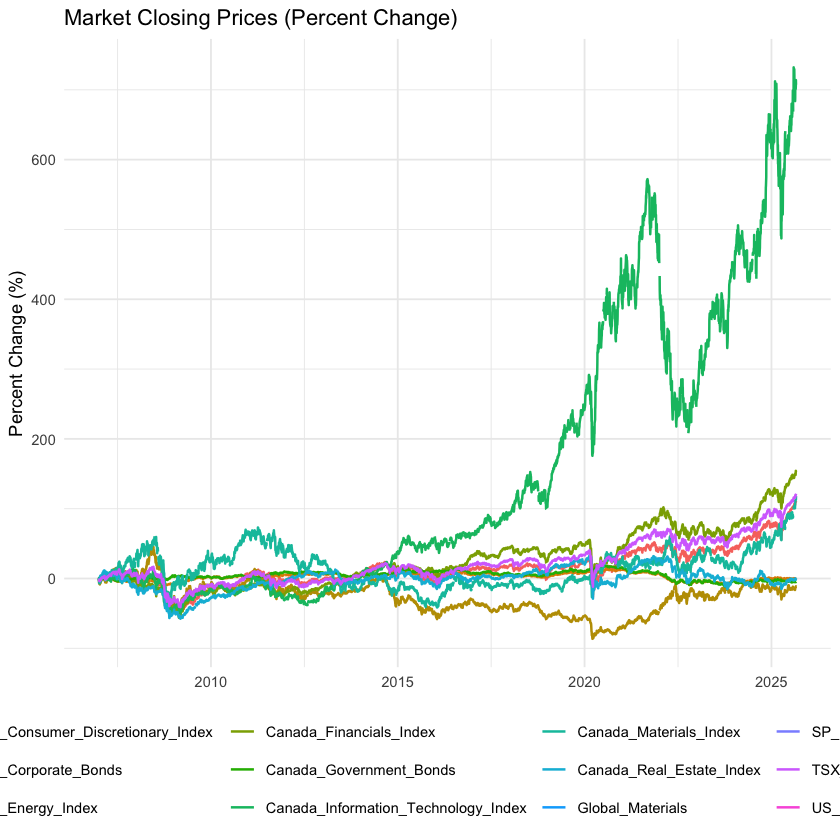

In [4]:
close_data <- get_markets_data("2007-01-01", "2025-09-01", "day", plot = TRUE)

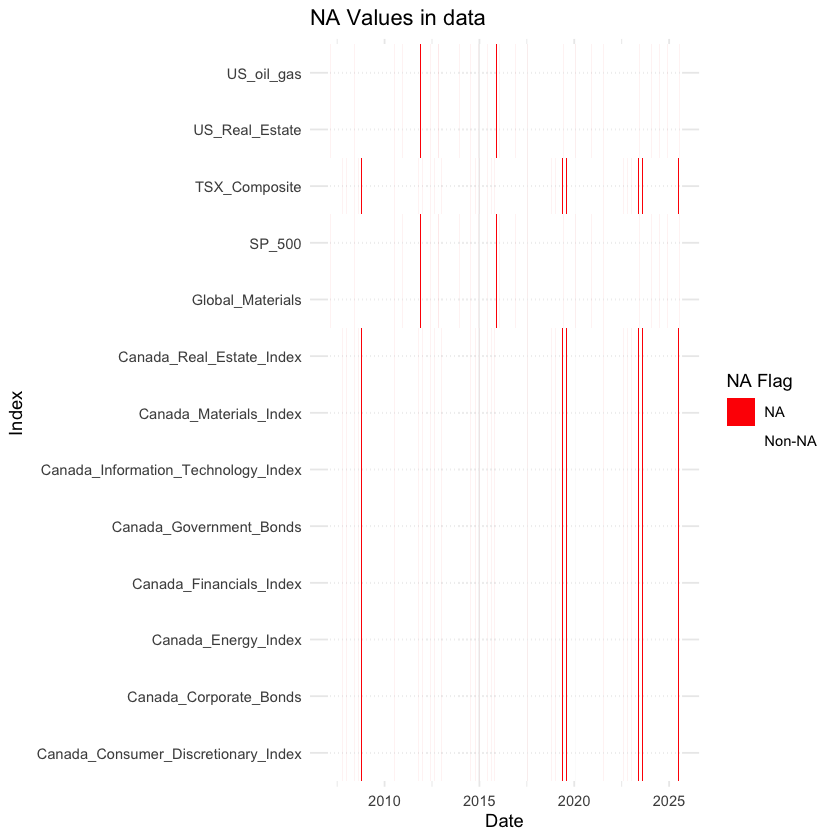

In [5]:
plot_na_matrix(close_data)

In [6]:
dim(close_data)

[1] 4782   14

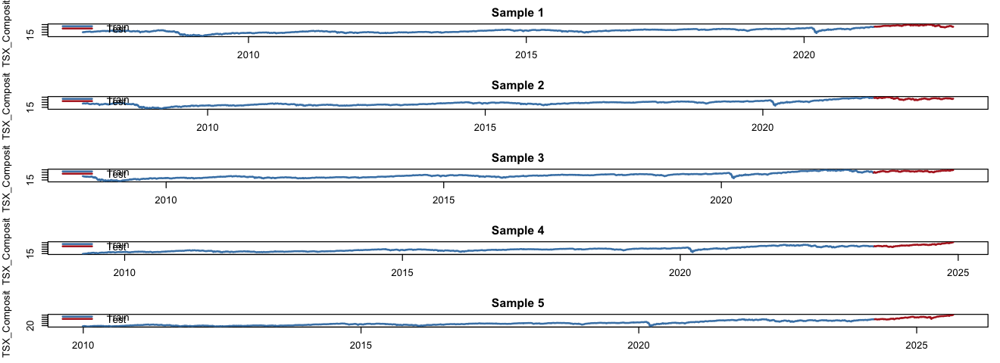

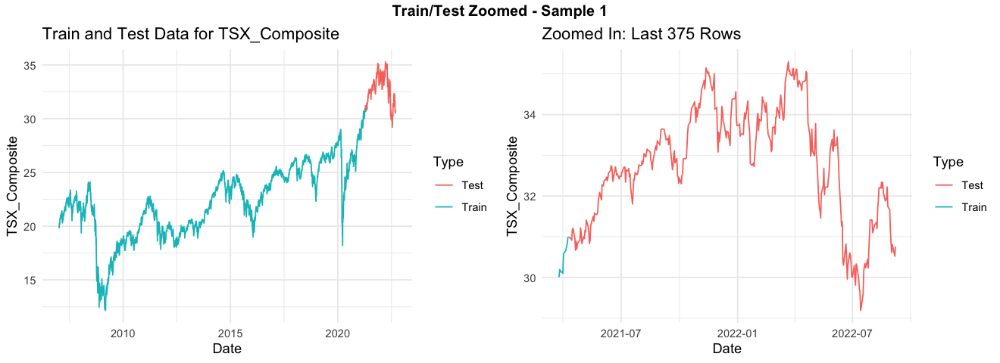

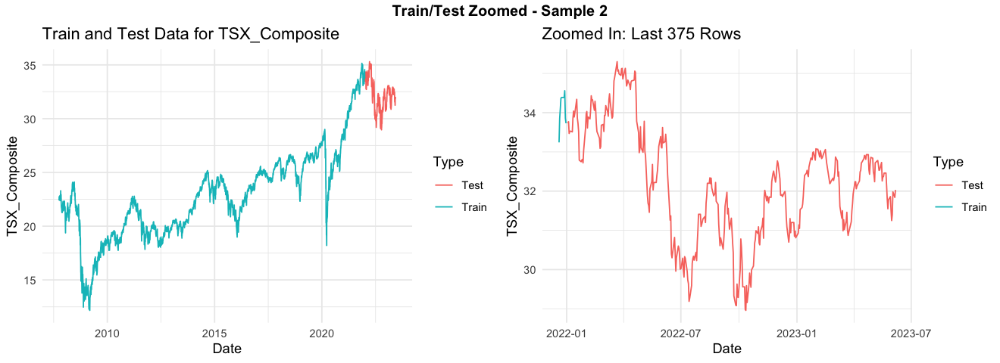

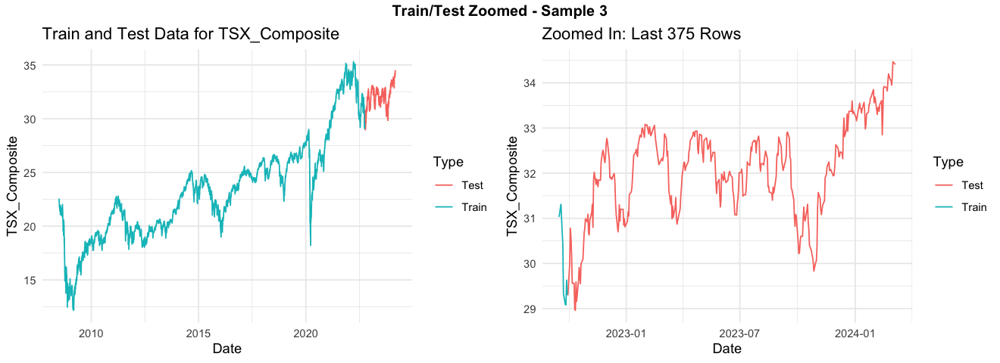

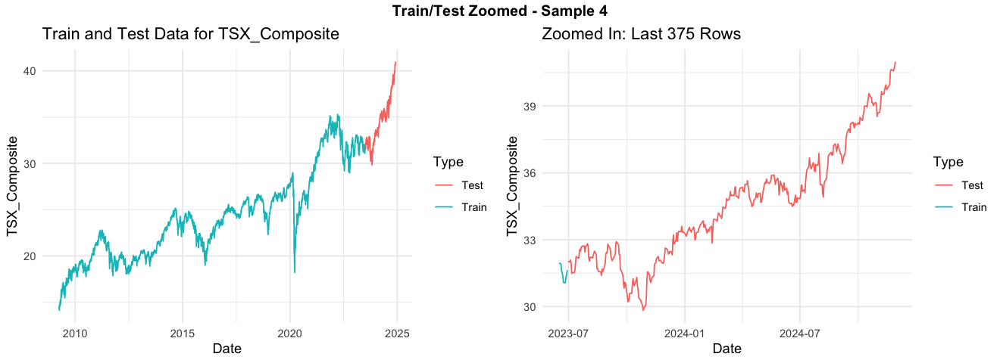

Warning message in hmm$fit(silent = TRUE):
“Convergence code was not zero, indicating that the optimizer may not have converged to the correct estimates. Please check by consulting the out() function which shows what nlminb returned.”


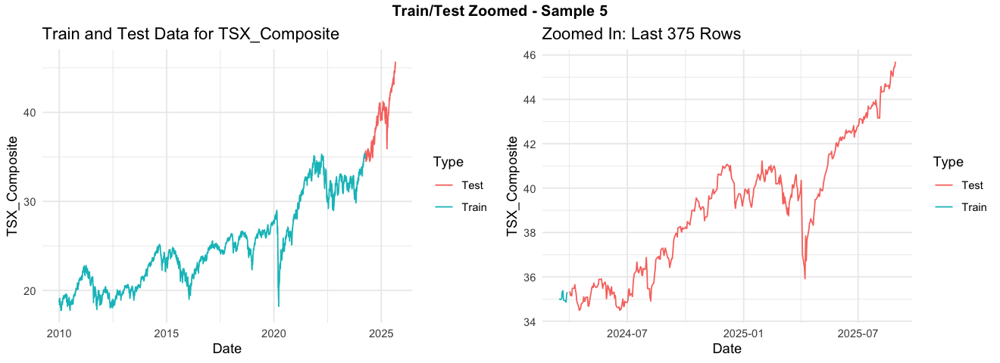

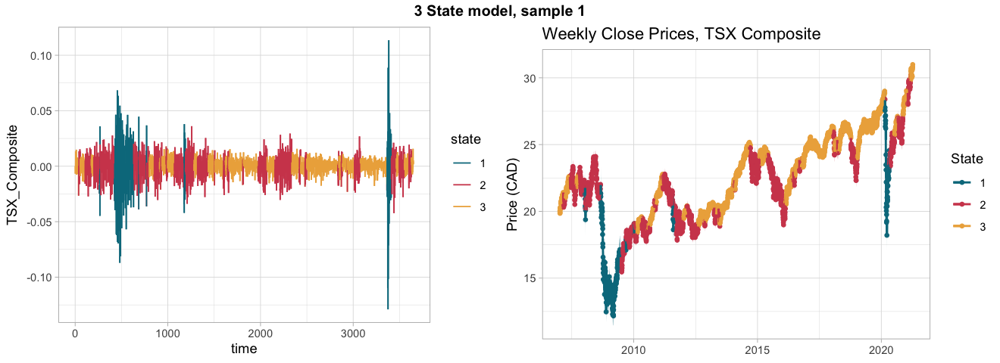

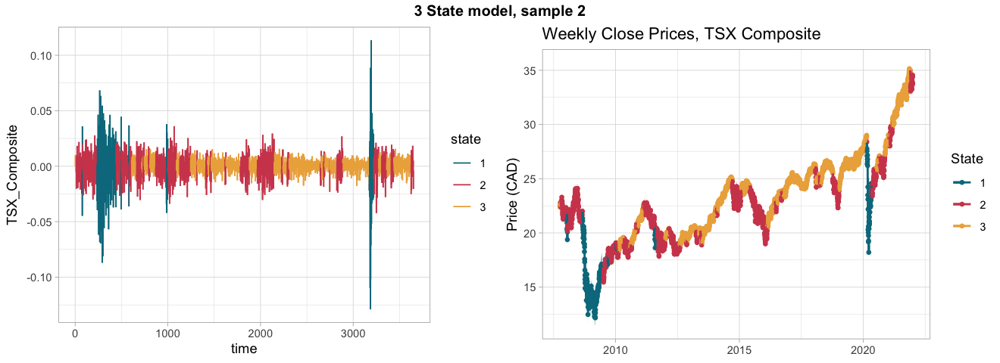

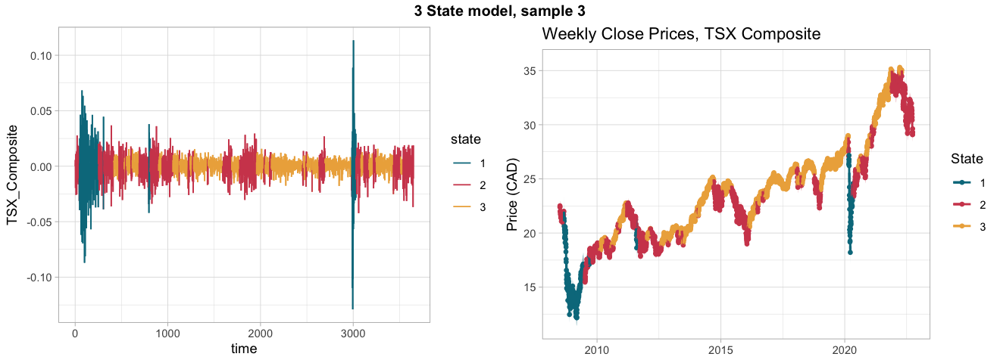

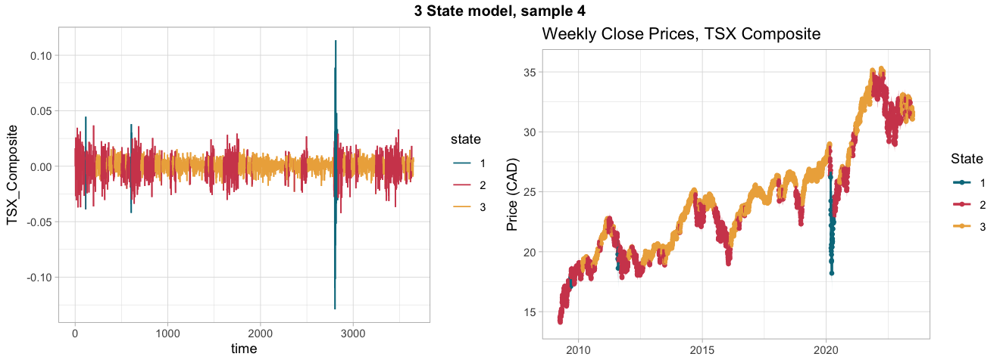

...

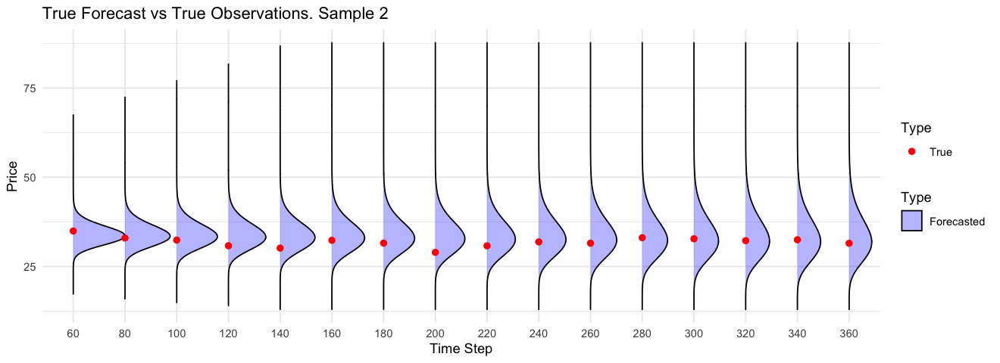

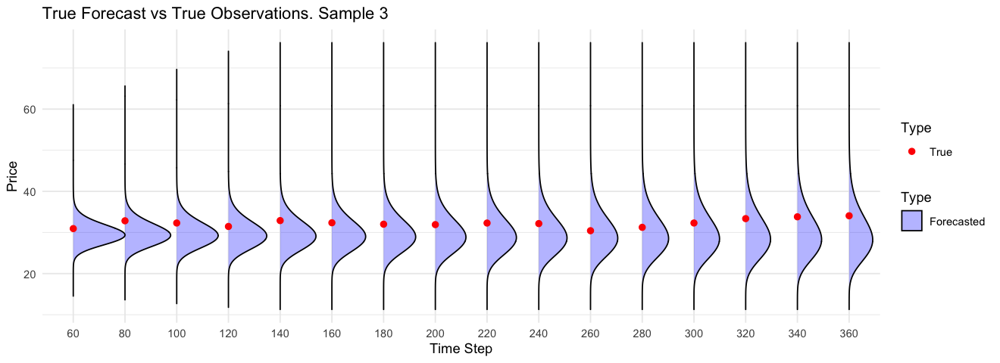

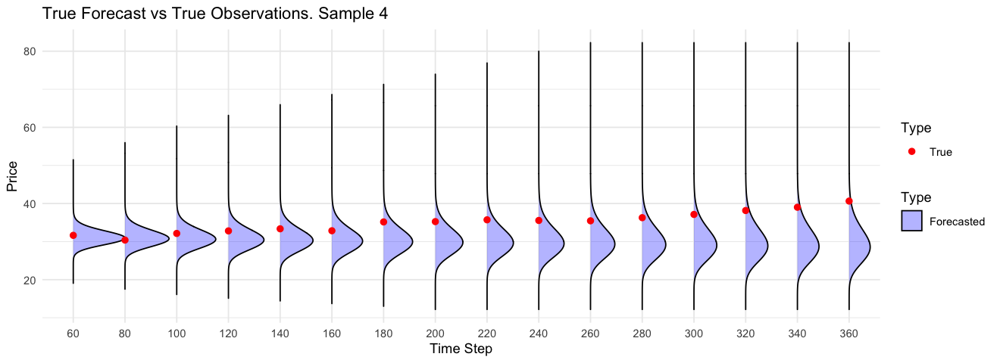

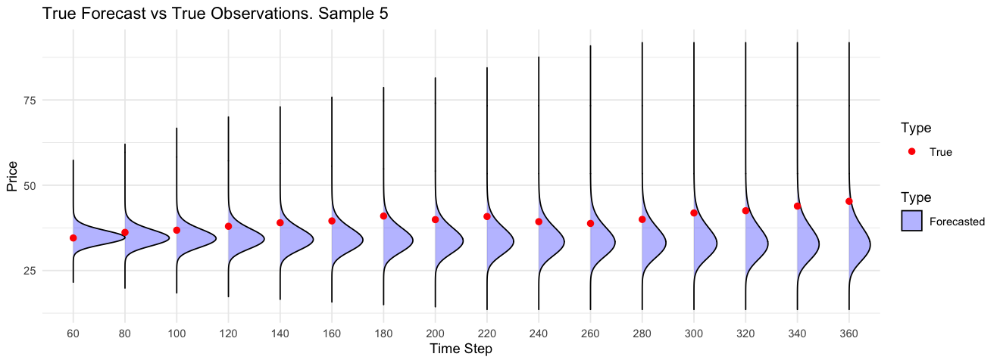

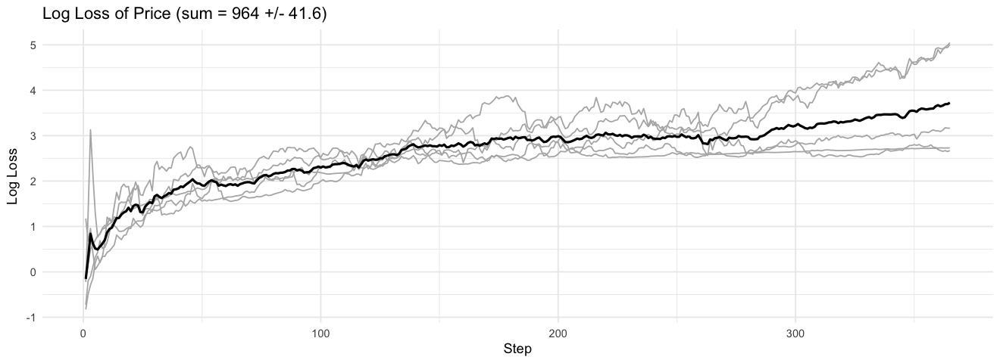

In [63]:
# Fill na values via last observation carried forward
close_data <- na.locf(close_data, na.rm = FALSE)

short_names <- c(
  "Canada_Financials_Index" = "Fin",
  "Canada_Energy_Index" = "Enrgy",
  "Canada_Materials_Index" = "Matrls",
  "Canada_Information_Technology_Index" = "Tech",
  "Canada_Real_Estate_Index" = "RE",
  "Canada_Consumer_Discretionary_Index" = "Consumer",
  "Canada_Corporate_Bonds" = "Corp_Bnds",
  "Canada_Government_Bonds" = "Gov_Bonds",
  "US_oil_gas" = "US_Oil",
  "Global_Materials" = "Glb_Mat",
  "US_Real_Estate" = "US_RE",
  "SP_500" = "SP_500"
)

# Ln transform the data, filling any remaining NAs with 0 (Caused when first value is NA)
close_data_log <- as.data.frame(na.fill(ln_transform(close_data), fill = 0))
rownames(close_data_log) <- rownames(close_data)

observation <- "TSX_Composite"
cov_data <- close_data_log %>%
  select(-all_of(observation)) %>%
  rename_with(~ short_names[.x], .cols = names(short_names))

window_length <- 5
cov_data_mean <- rollapply(cov_data, width = window_length, FUN = mean, align = "right", fill = NA)
colnames(cov_data_mean) <- paste0(colnames(cov_data_mean), "_mean")
cov_data_sd <- rollapply(cov_data, width = window_length, FUN = sd, align = "right", fill = NA)
colnames(cov_data_sd) <- paste0(colnames(cov_data_sd), "_sd")

data_all <- cbind(close_data[observation], cov_data_mean, cov_data_sd)[window_length:nrow(close_data_log), ]

samples <- train_test_split(
  data = data_all,
  training_period = 365*10,
  testing_period = 365,
  samples = 5
)

obs_train <- lapply(samples$train, function(df) df[, observation, drop = FALSE])
obs_test  <- lapply(samples$test,  function(df) df[, observation, drop = FALSE])
cov_train <- lapply(samples$train, function(df) df[, -which(names(df) == observation), drop = FALSE])
cov_test  <- lapply(samples$test,  function(df) df[, -which(names(df) == observation), drop = FALSE])

tsx_only <- run_hmm_analysis(
  observation = "TSX_Composite",
  obs_train = obs_train,
  obs_test = obs_test,
  cov_train = cov_train,
  cov_test = cov_test,
  hidden_states = 3,
  hid_formula = as.formula("~1"),
  horseshoe = FALSE,
  plot_folder = "tsx_only_plots"
)

## Covariates without horseshoe

In [11]:
cov_colnames <- colnames(cov_train[[1]])
print(length(cov_colnames))
hid_formula <- as.formula(paste("~1 +", paste(cov_colnames, collapse = " + ")))
hid_formula

[1] 24


~1 + Fin_mean + Enrgy_mean + Matrls_mean + Tech_mean + RE_mean + 
    Consumer_mean + Corp_Bnds_mean + Gov_Bondss_mean + US_Oil_mean + 
    Glb_Mat_mean + US_RE_mean + SP_500_mean + Fin_sd + Enrgy_sd + 
    Matrls_sd + Tech_sd + RE_sd + Consumer_sd + Corp_Bnds_sd + 
    Gov_Bondss_sd + US_Oil_sd + Glb_Mat_sd + US_RE_sd + SP_500_sd

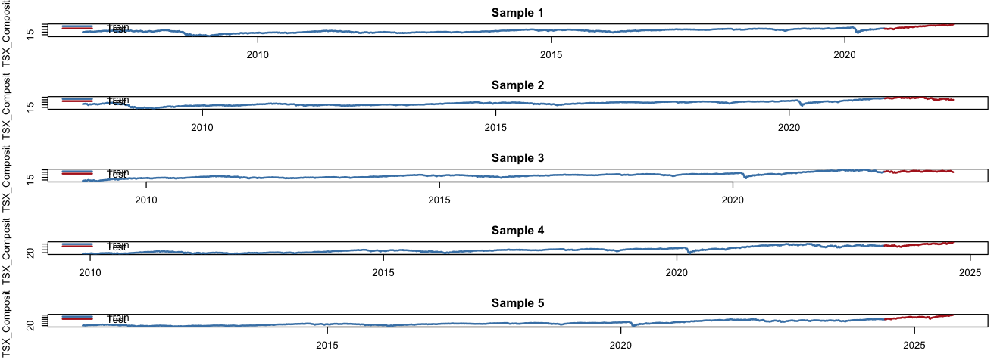

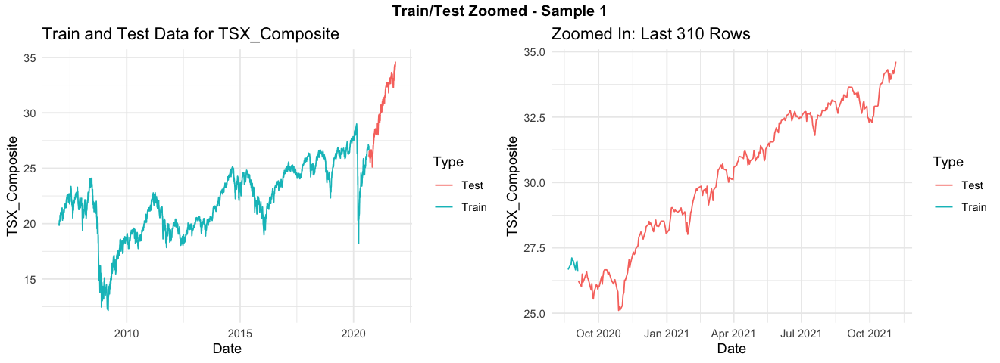

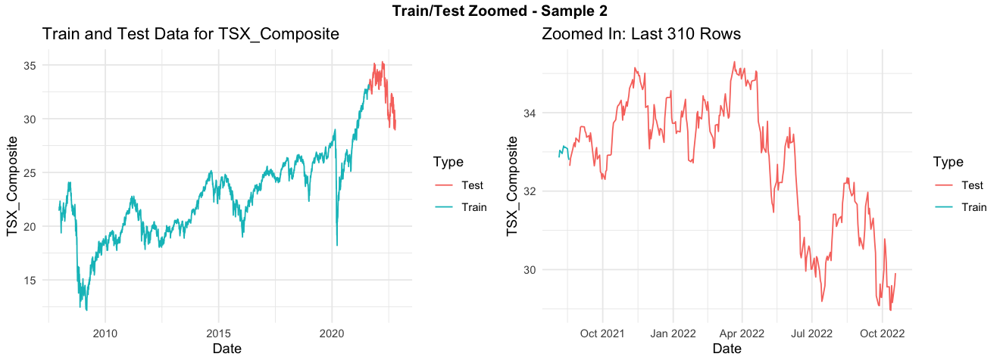

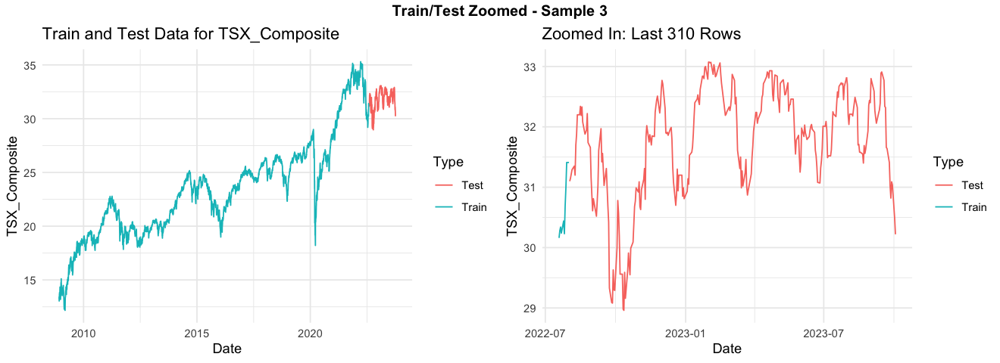

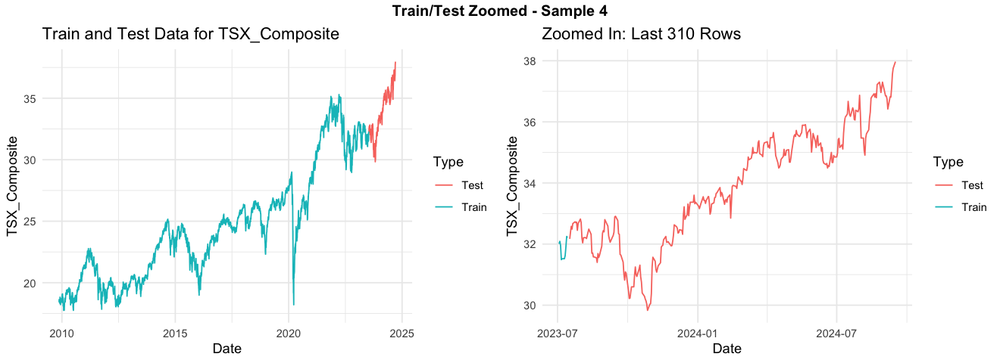

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Warning message in nlminb(start = args$par, objective = args$fn, gradient = args$gr, :
“NA/NaN function evaluation”
Warning message in nlminb(start = args$par, objectiv

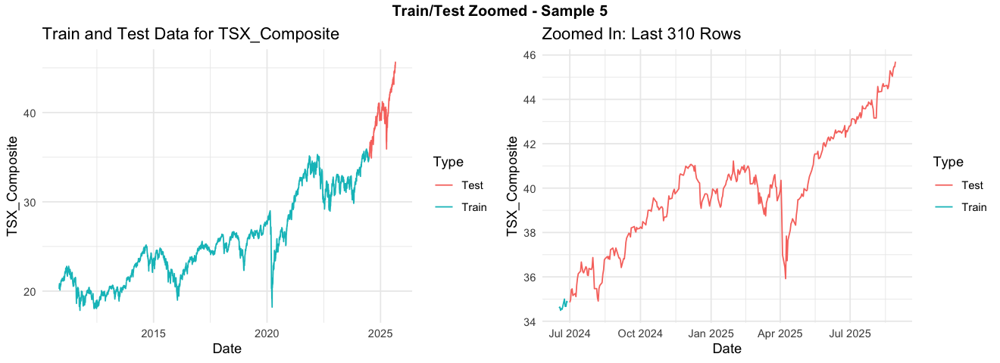

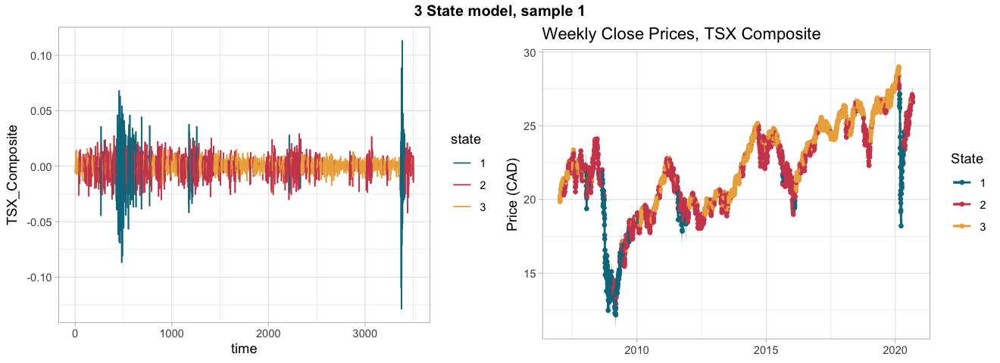

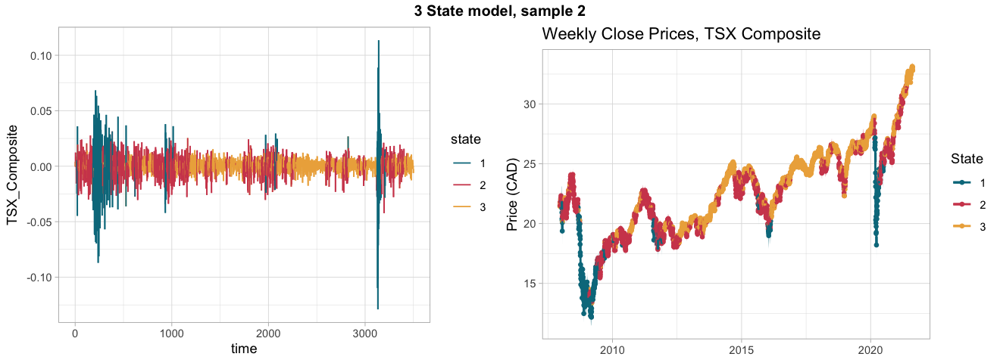

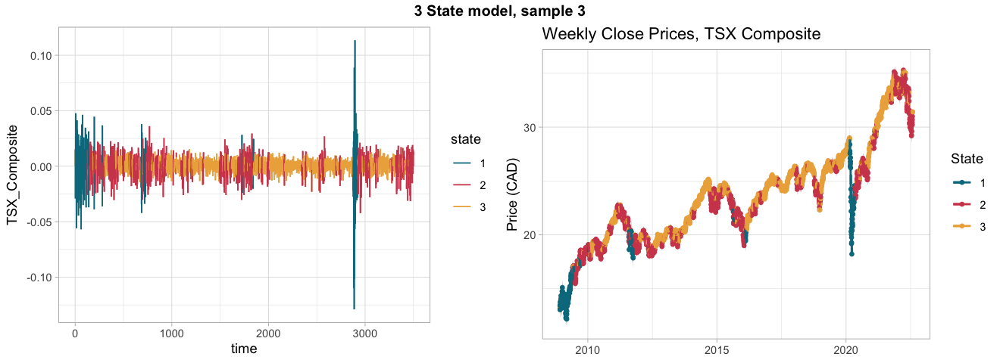

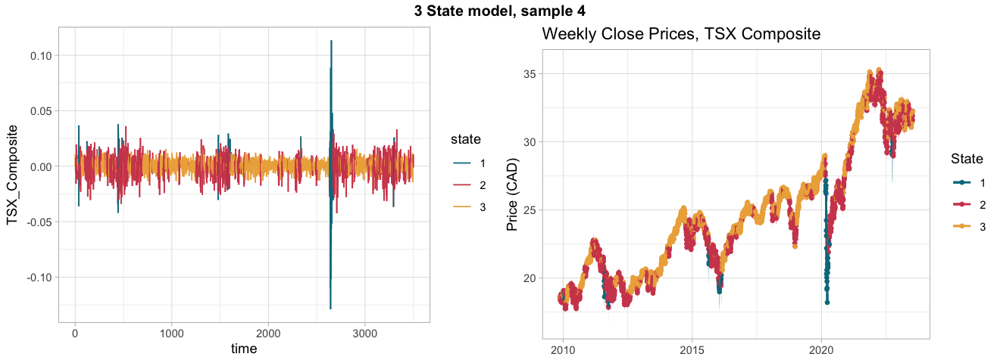

...

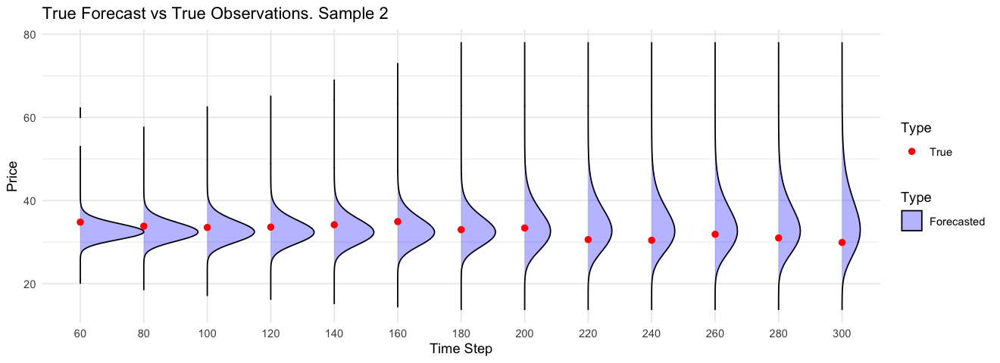

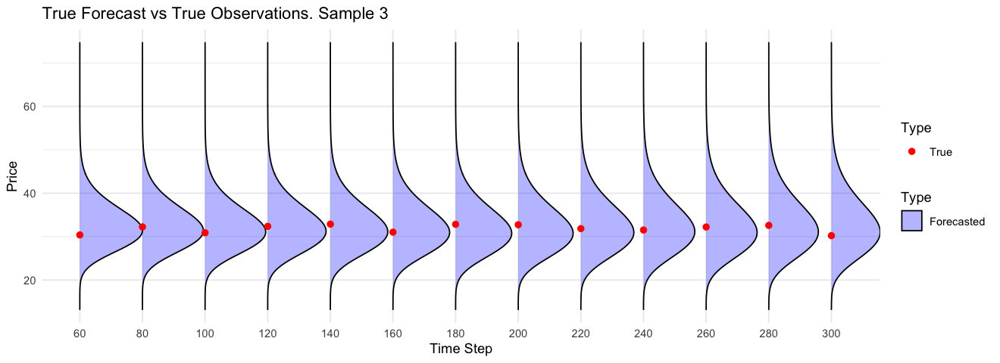

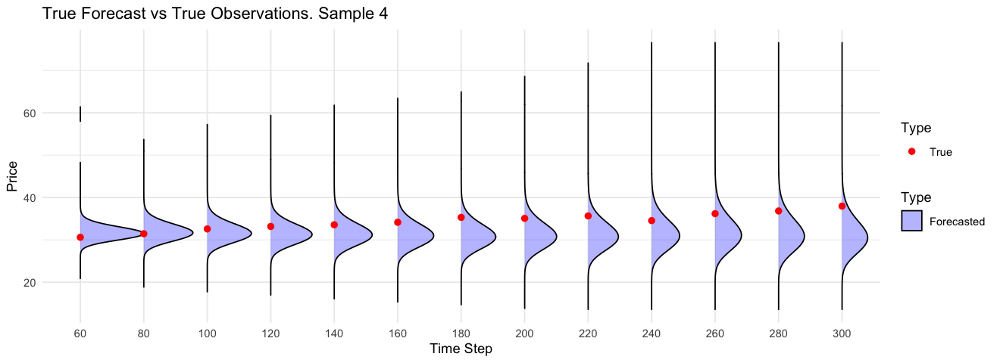

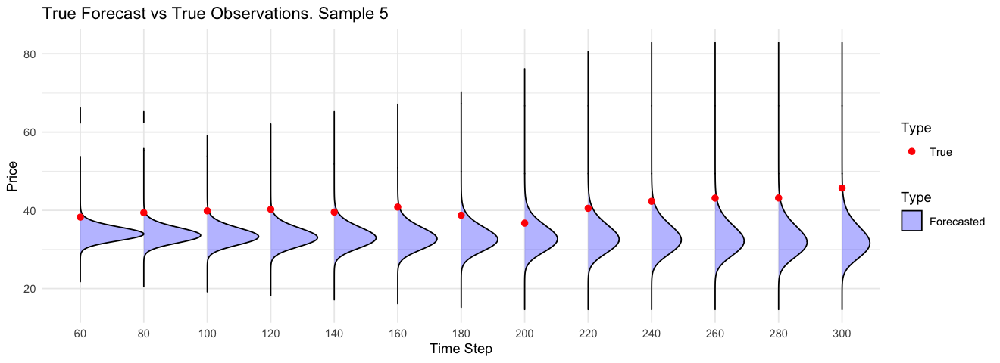

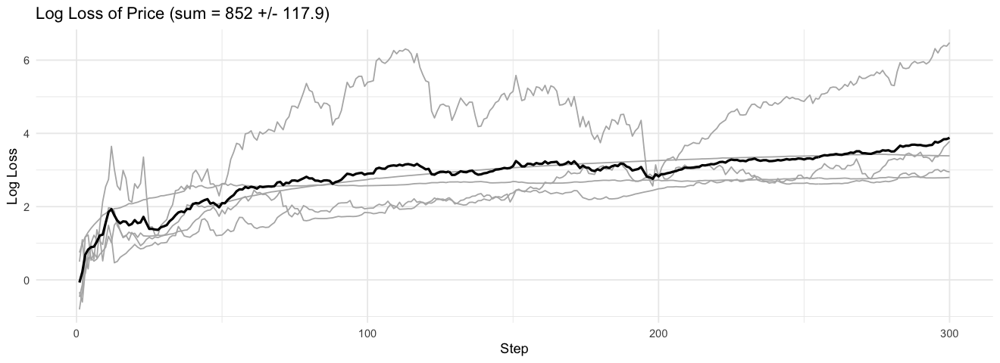

In [12]:
covariates_no_horseshoe_3s <- run_hmm_analysis(
  observation = "TSX_Composite",
  obs_train = obs_train,
  obs_test = obs_test,
  cov_train = cov_train,
  cov_test = cov_test,
  hidden_states = 3,
  hid_formula = hid_formula,
  horseshoe = FALSE,
  plot_folder = "cov_no_horseshoe_3s"
)

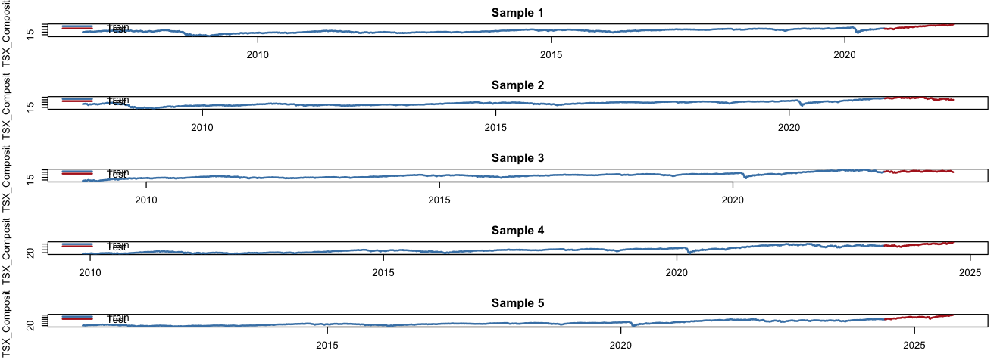

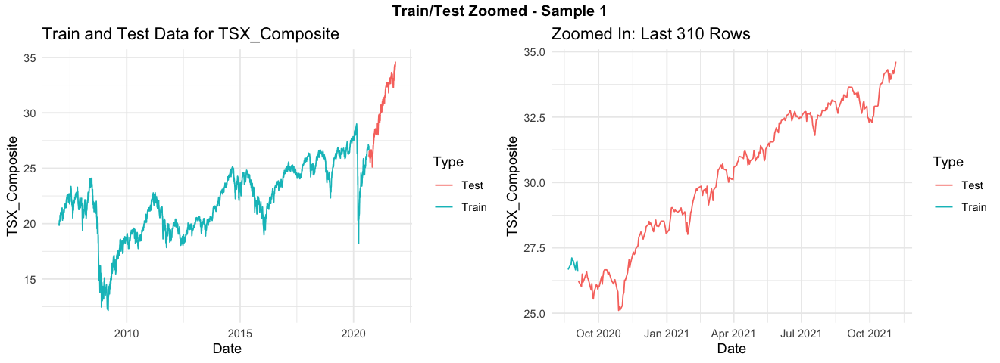

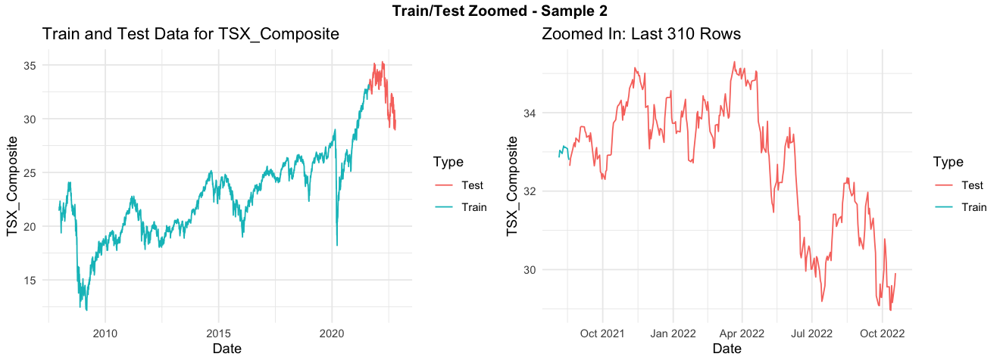

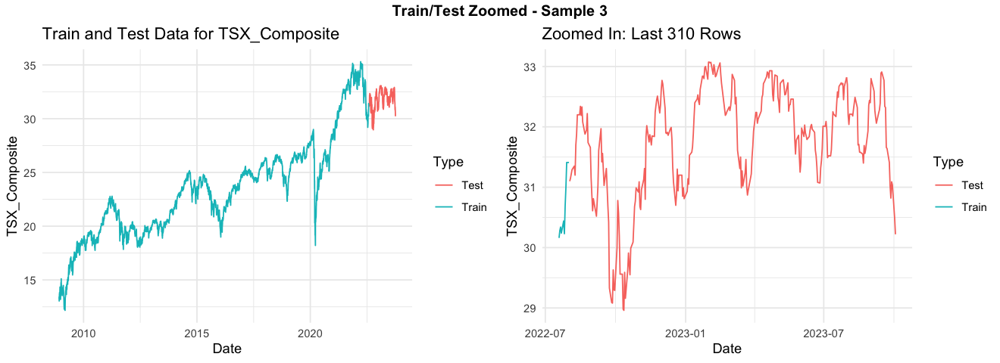

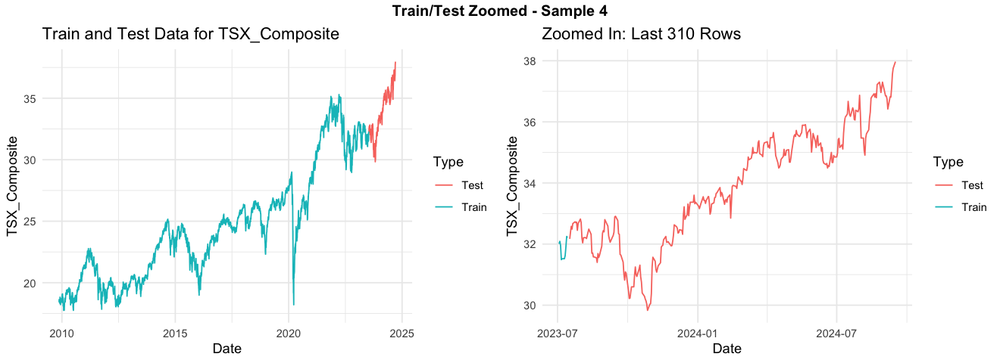

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Warning message in hmm$fit(silent = TRUE):
“Convergence code was not zero, indicating that the optimizer may not have converged to the correct estimates. Please check b

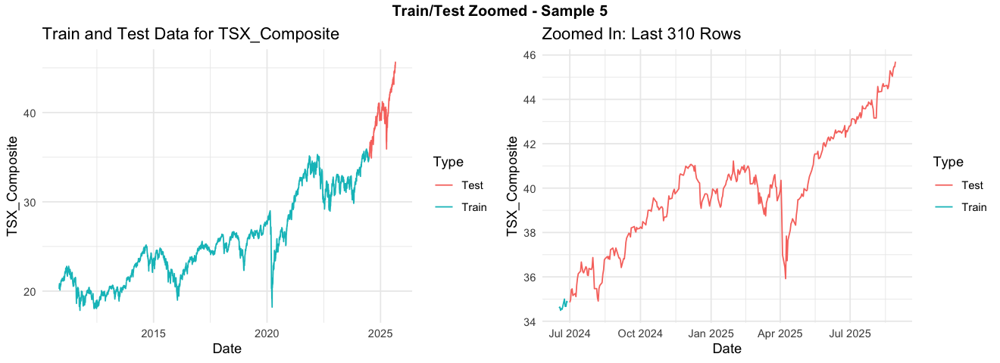

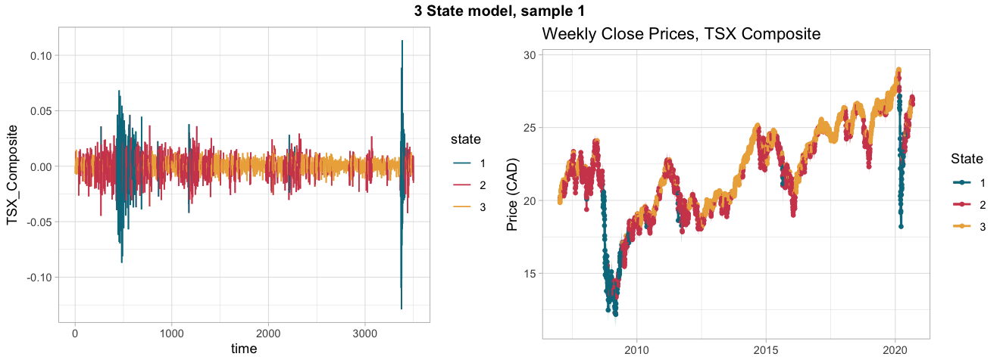

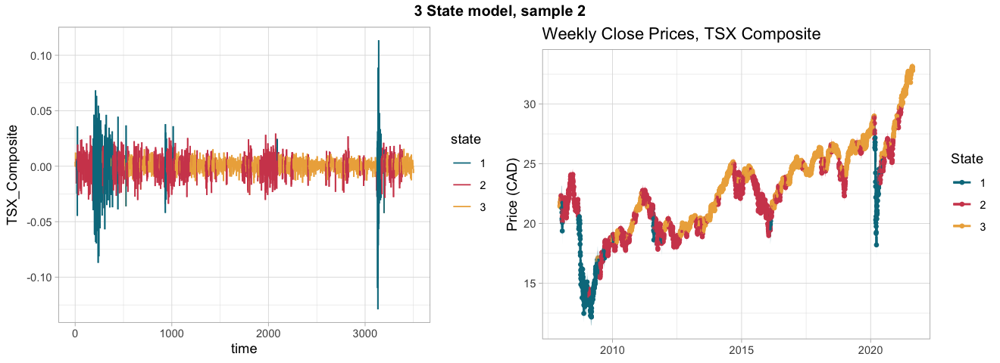

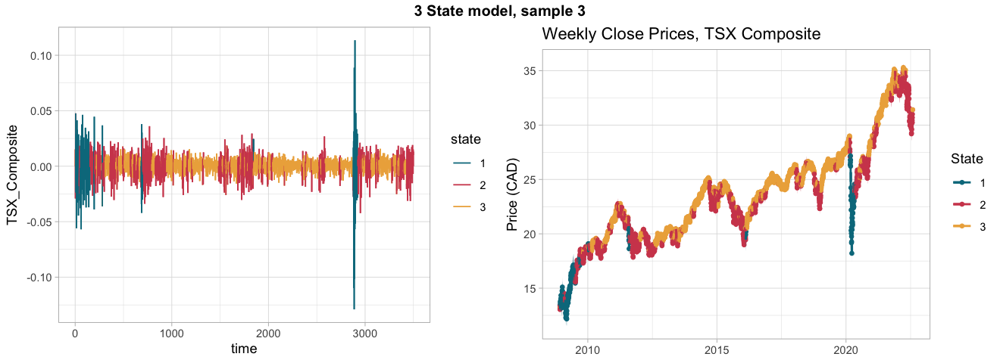

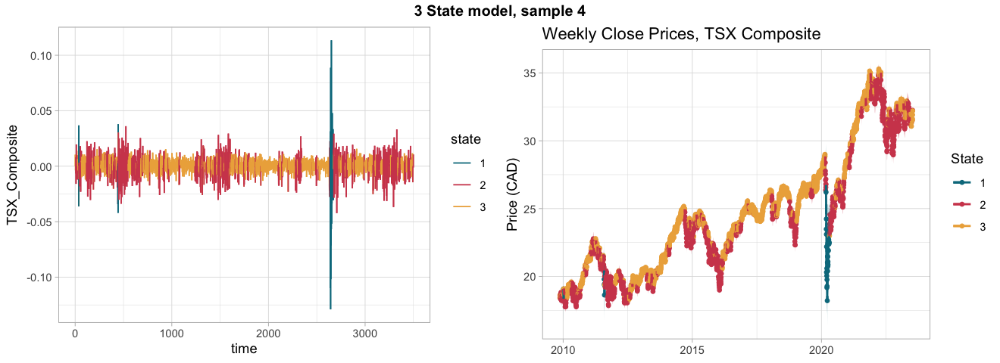

...

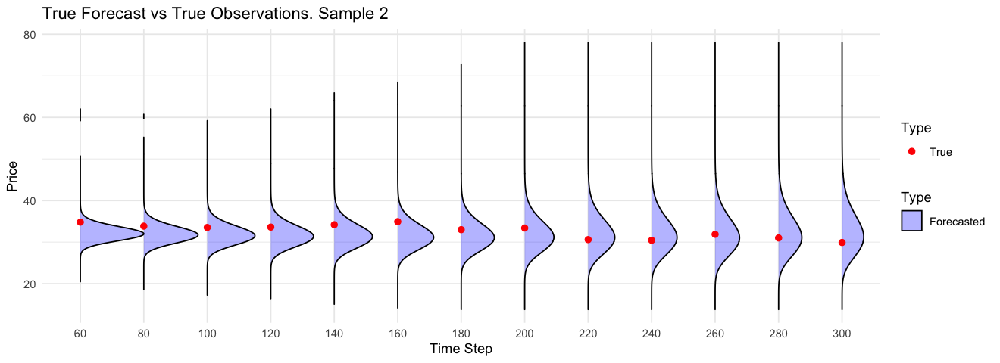

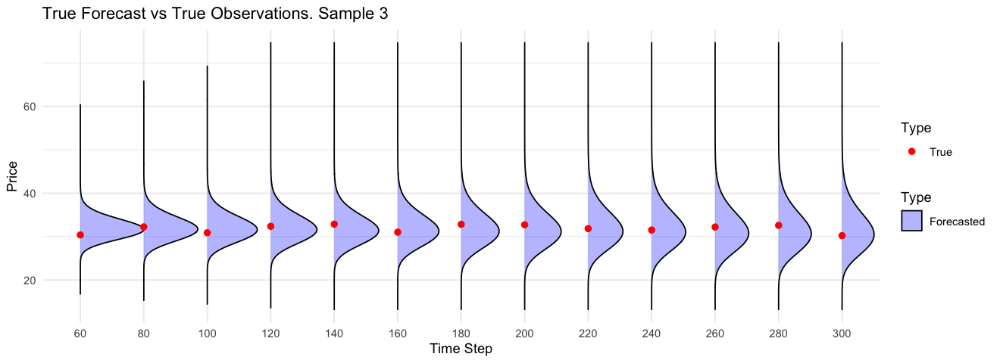

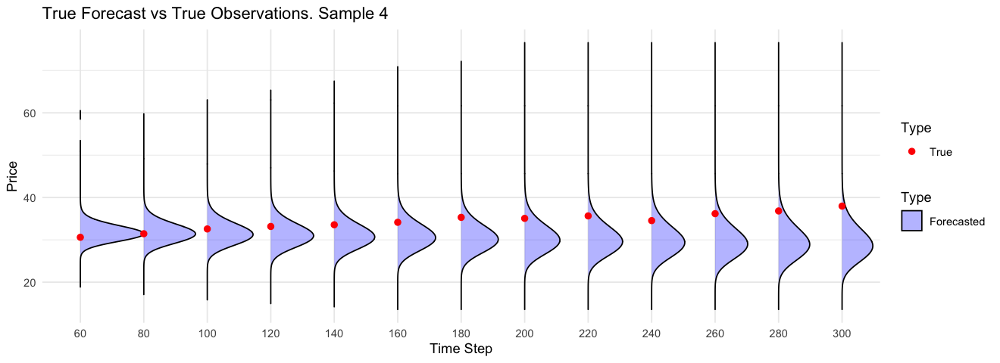

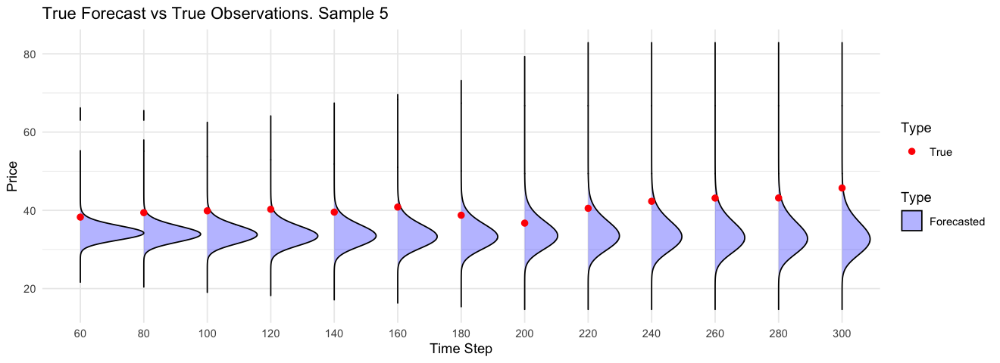

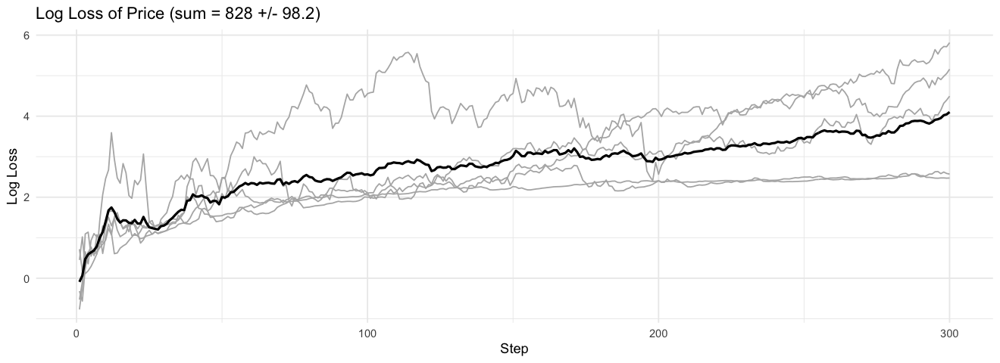

In [13]:
covariates_with_horseshoe_3s <- run_hmm_analysis(
  observation = "TSX_Composite",
  obs_train = obs_train,
  obs_test = obs_test,
  cov_train = cov_train,
  cov_test = cov_test,
  hidden_states = 3,
  hid_formula = hid_formula,
  horseshoe = TRUE,
  plot_folder = "cov_with_horseshoe_3s"
)

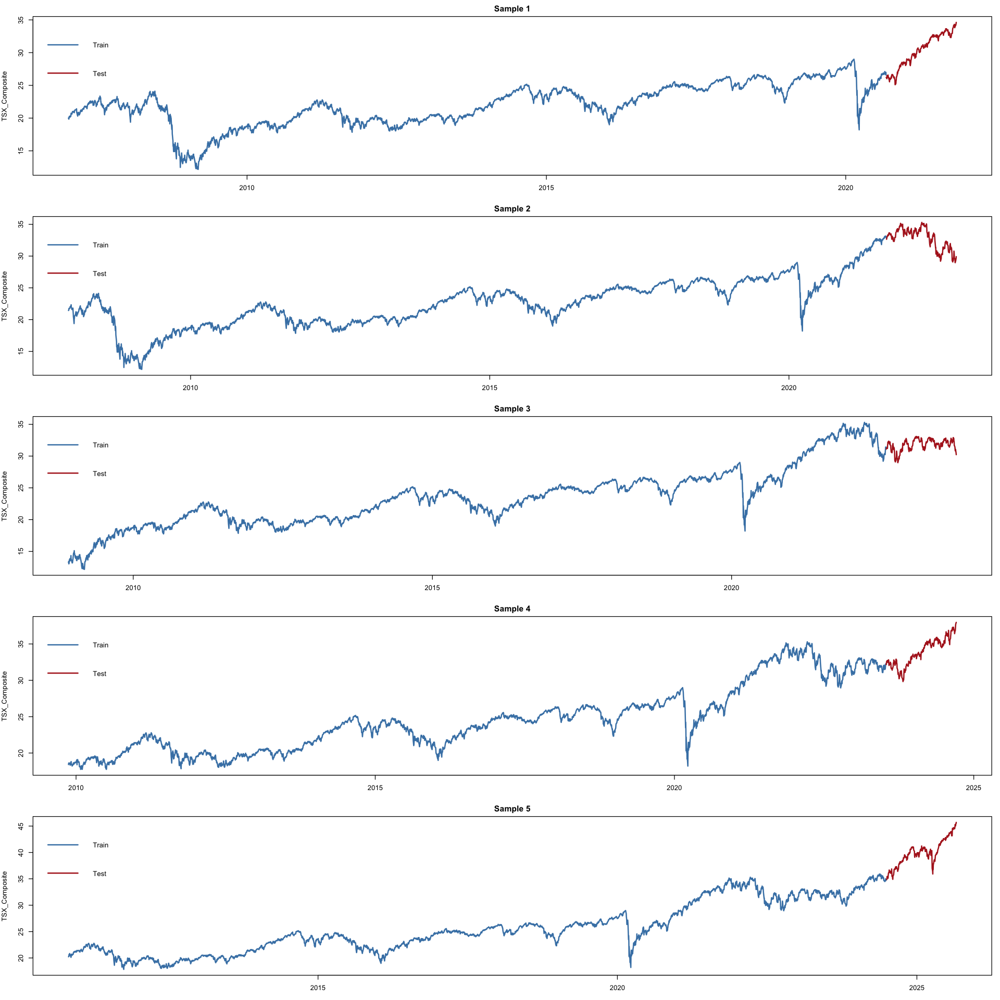

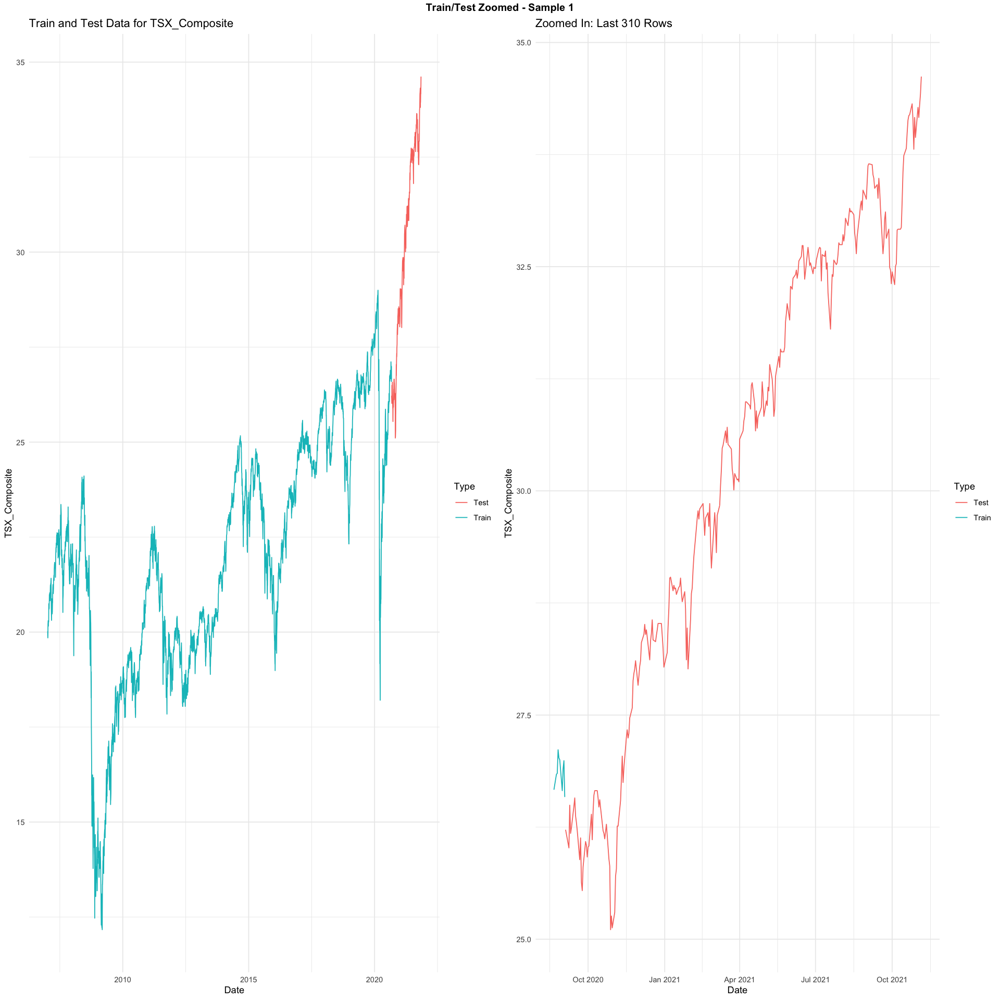

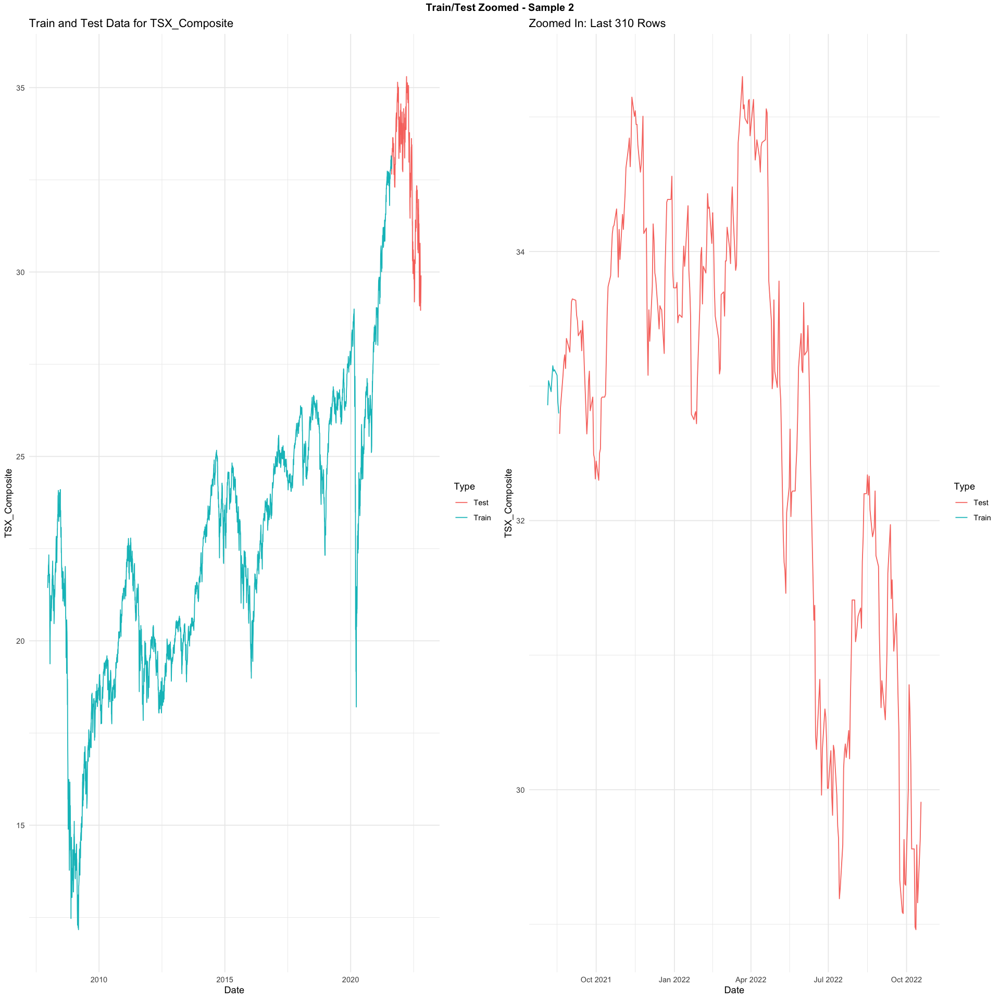

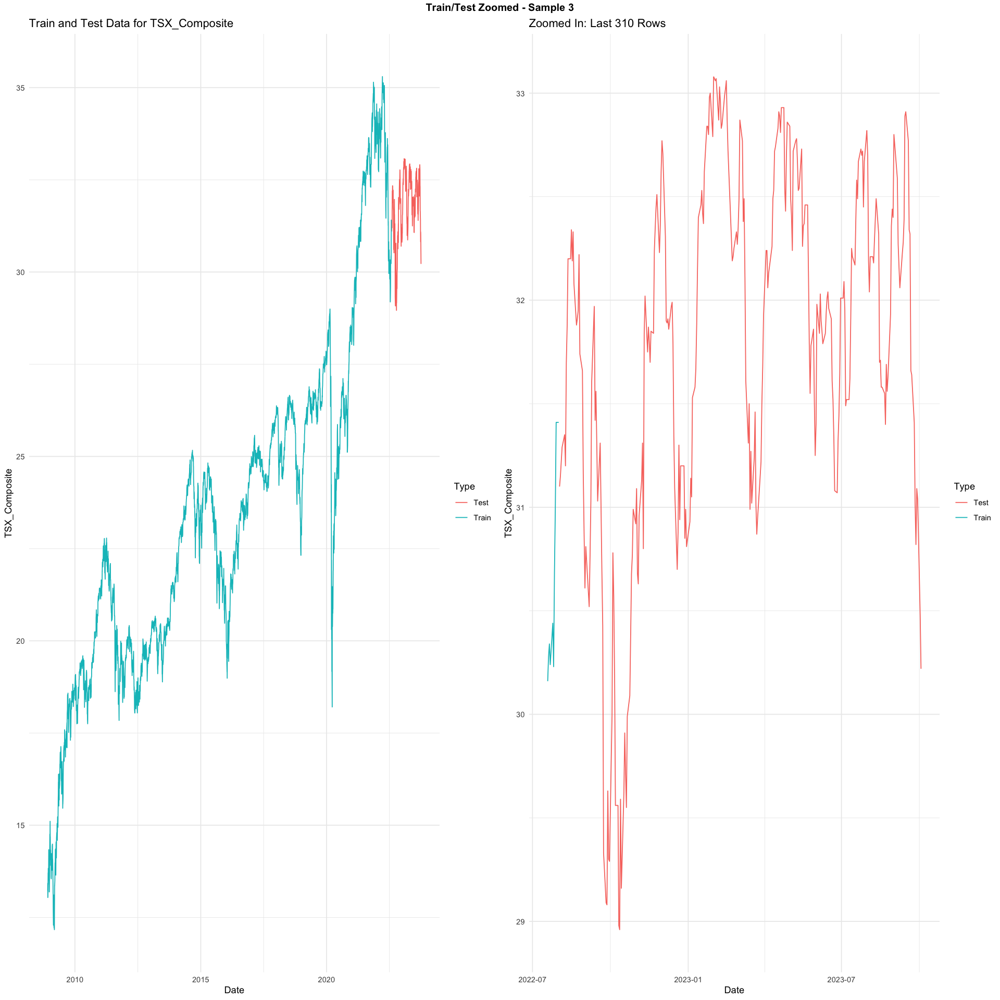

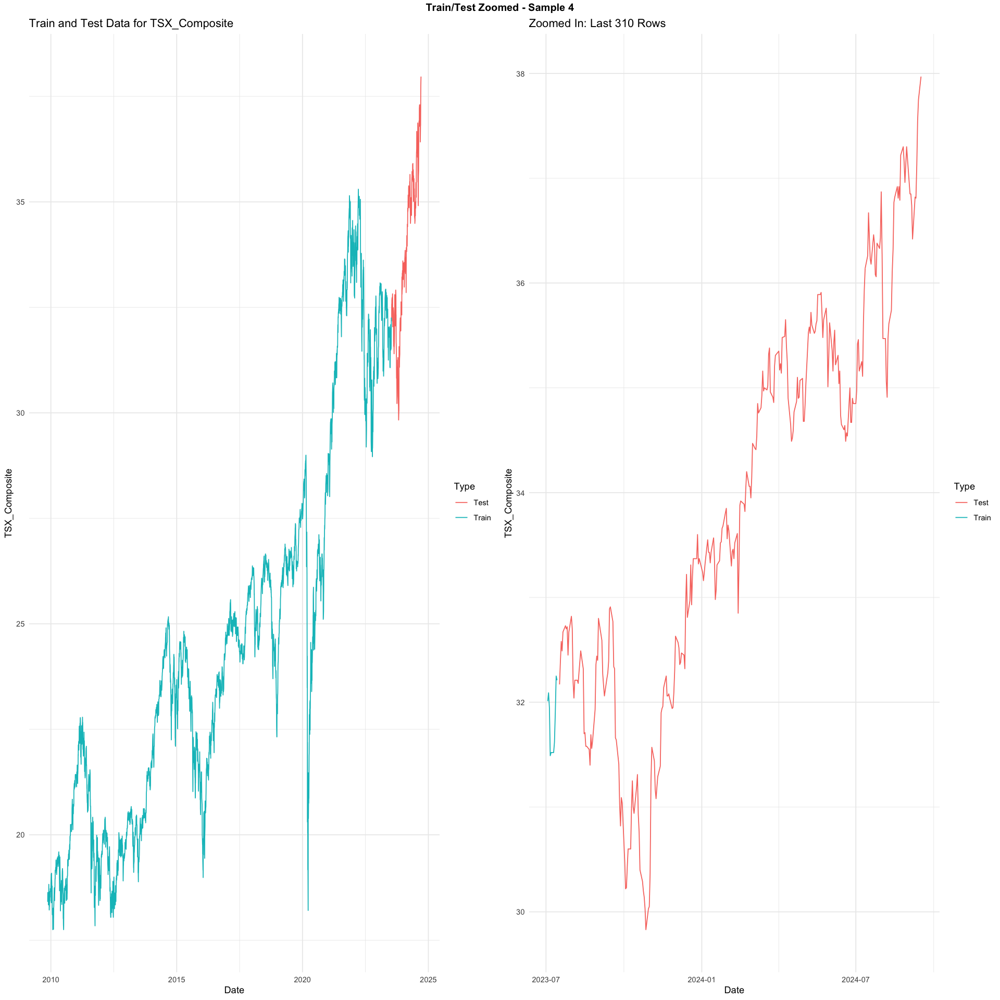

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Replacing NAs in covariates by last non-NA values.

Warning message in hmm$fit(silent = TRUE):
“Convergence code was not zero, indicating that the optimizer may not have converged to the correct estimates. Please check b

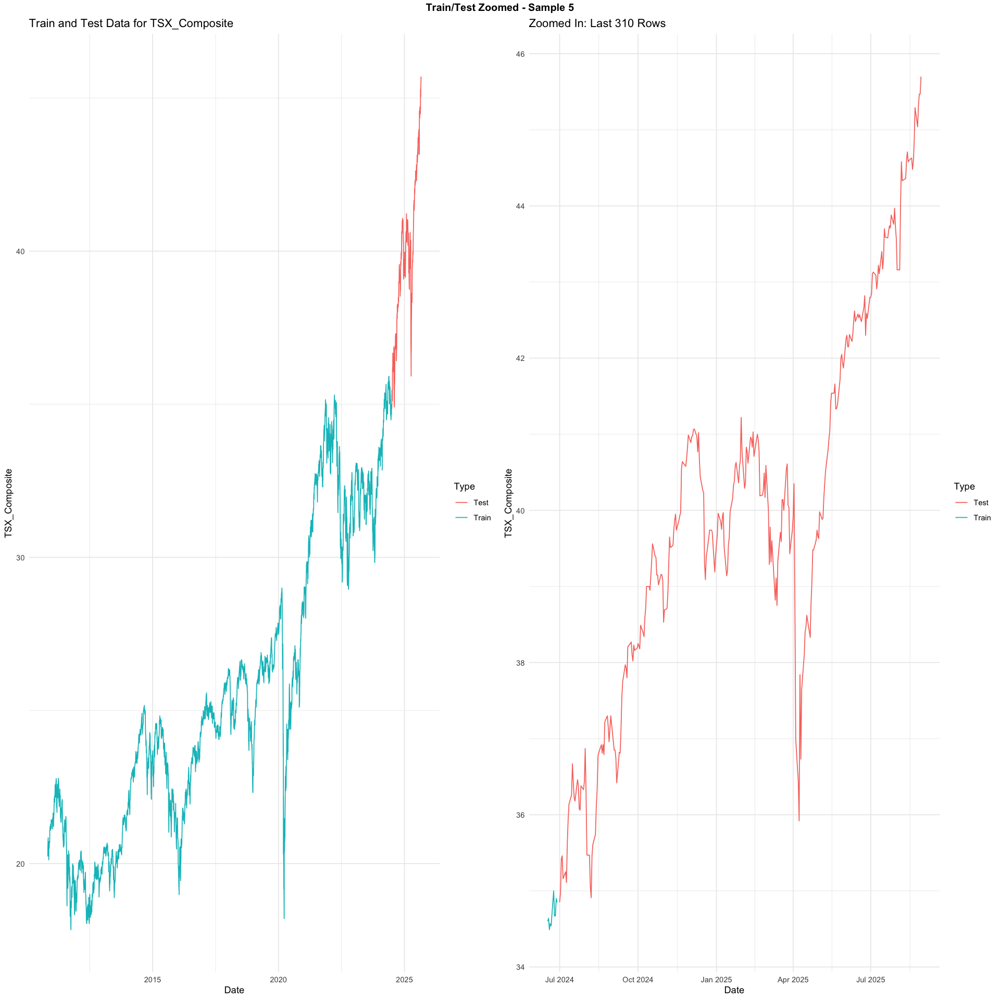

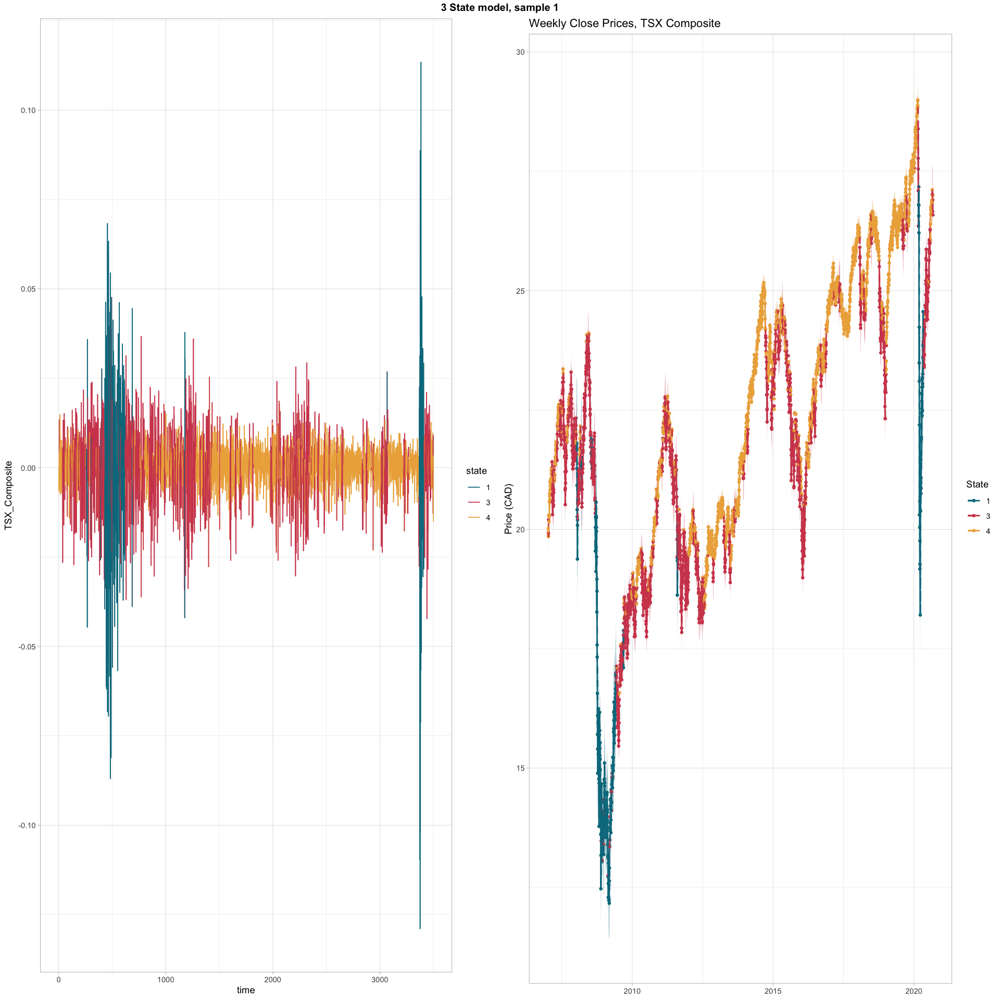

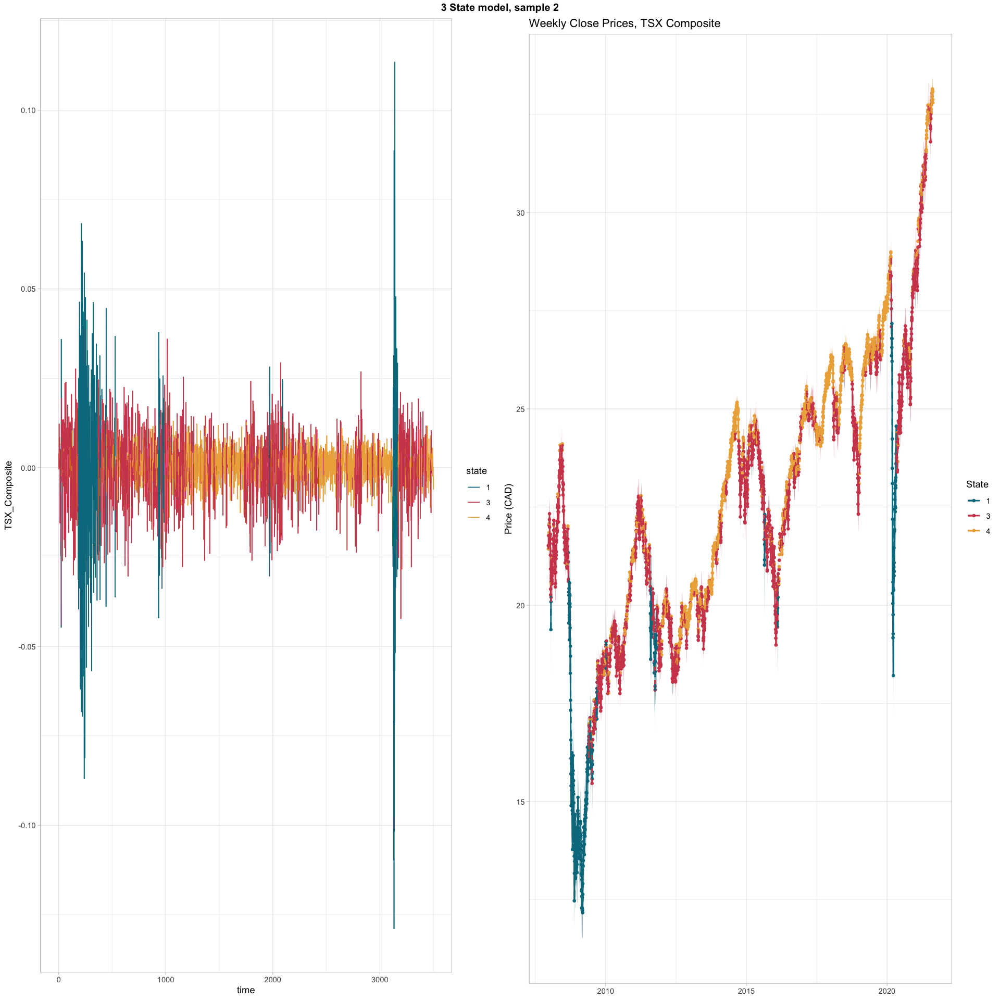

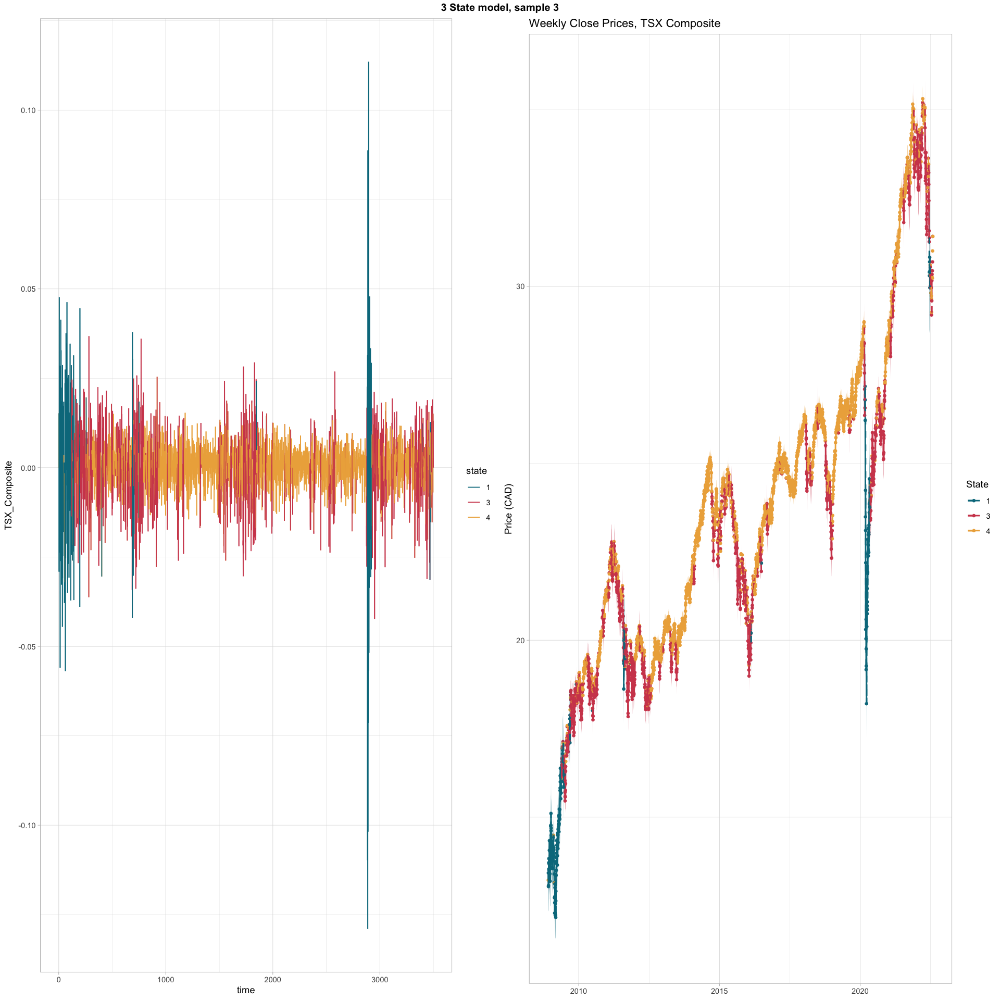

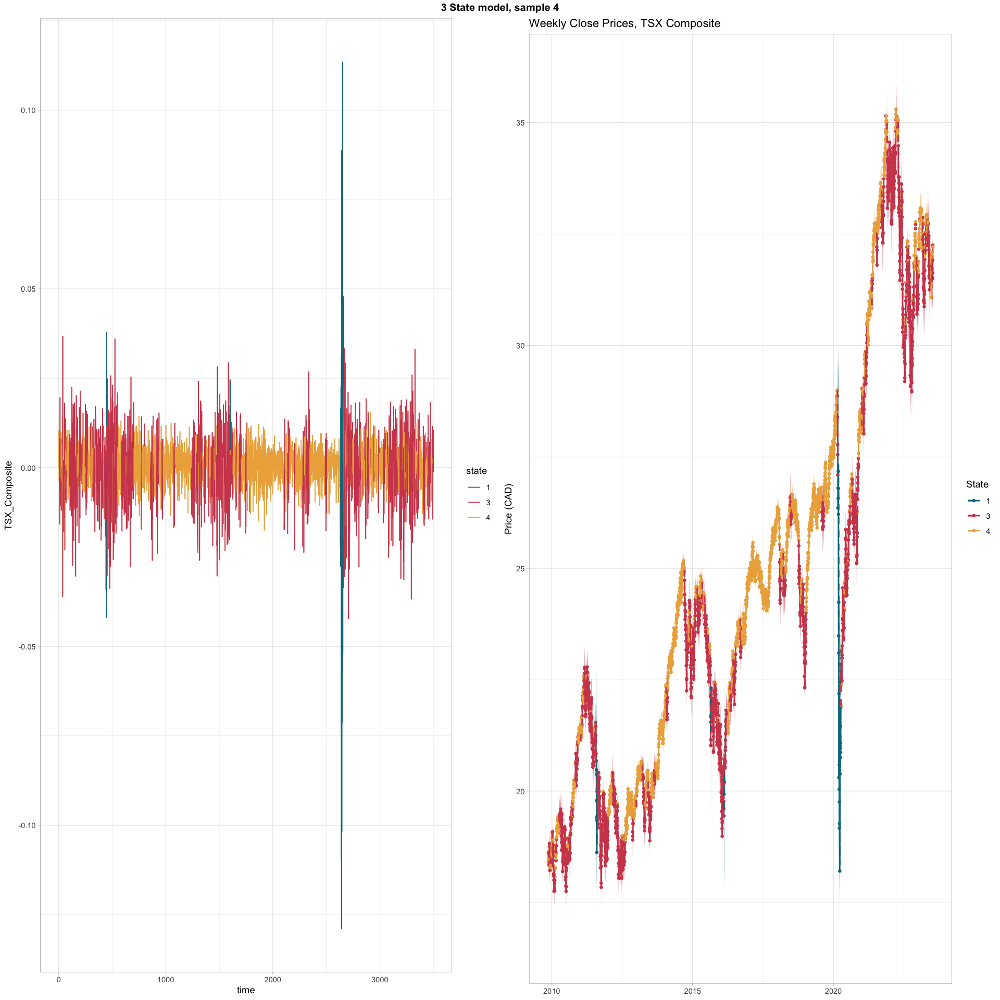

...

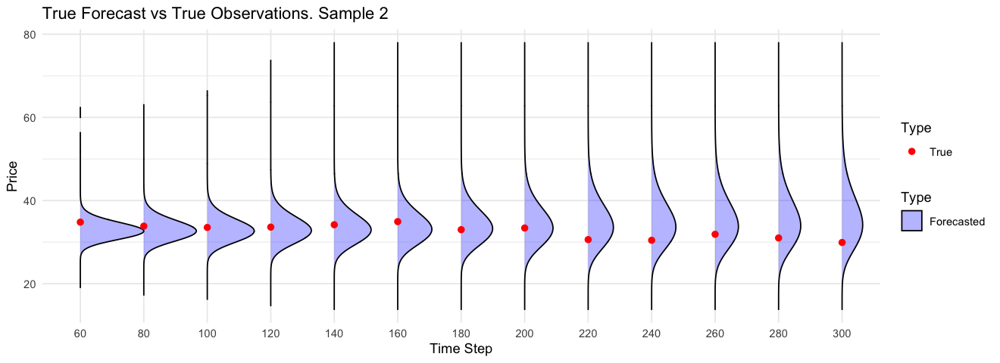

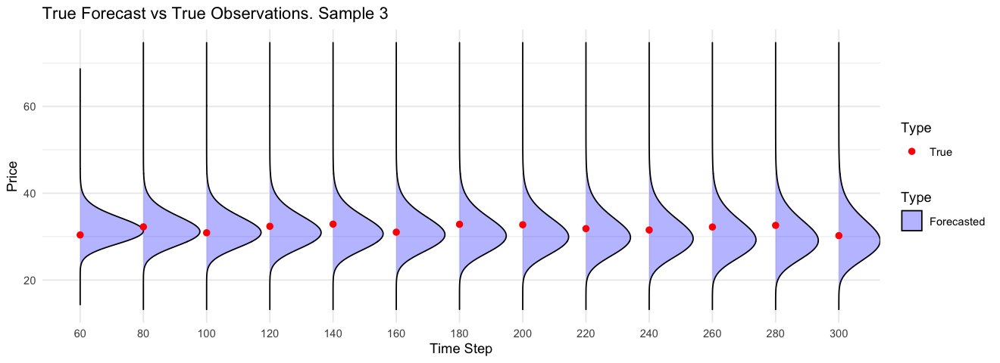

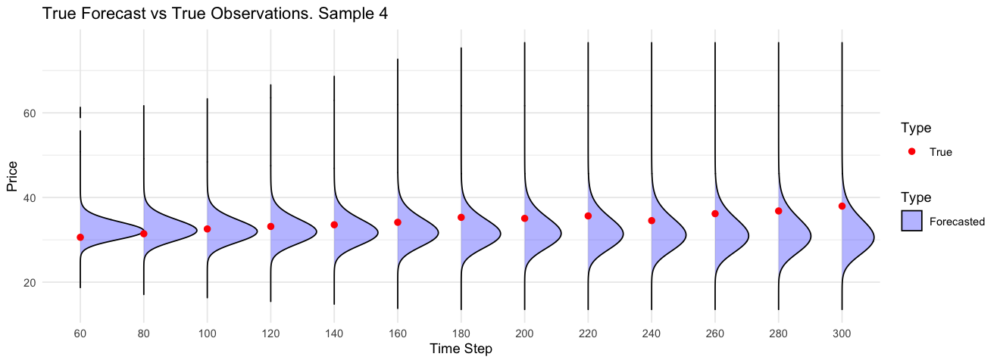

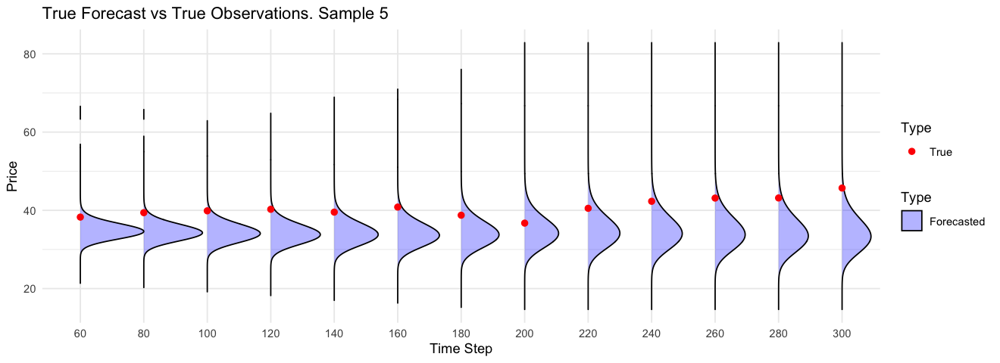

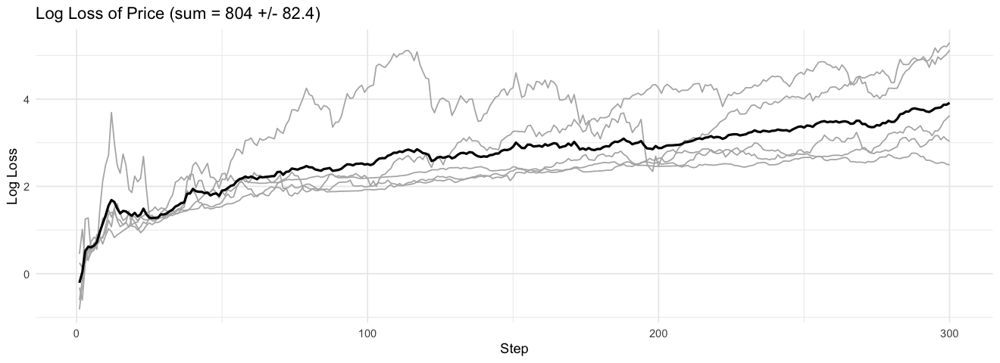

In [19]:
covariates_with_horseshoe_4s <- run_hmm_analysis(
  observation = "TSX_Composite",
  obs_train = obs_train,
  obs_test = obs_test,
  cov_train = cov_train,
  cov_test = cov_test,
  hidden_states = 4,
  hid_formula = hid_formula,
  horseshoe = TRUE,
  plot_folder = "cov_with_horseshoe_4s"
)

In [14]:
covariates_with_horseshoe_3s$hmms[[1]]$print_obspar()
covariates_with_horseshoe_3s$hmms[[2]]$print_obspar()
covariates_with_horseshoe_3s$hmms[[3]]$print_obspar()
covariates_with_horseshoe_3s$hmms[[4]]$print_obspar()
covariates_with_horseshoe_3s$hmms[[5]]$print_obspar()

> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean  -0.001   0.000   0.001
TSX_Composite.sd     0.033   0.011   0.005



> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean   0.000    0.00   0.001
TSX_Composite.sd     0.032    0.01   0.005

> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean   0.001   0.000   0.001
TSX_Composite.sd     0.028   0.011   0.005

> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean  -0.002   0.000   0.001
TSX_Composite.sd     0.053   0.011   0.004

> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean  -0.001  -0.001   0.001
TSX_Composite.sd     0.055   0.011   0.004



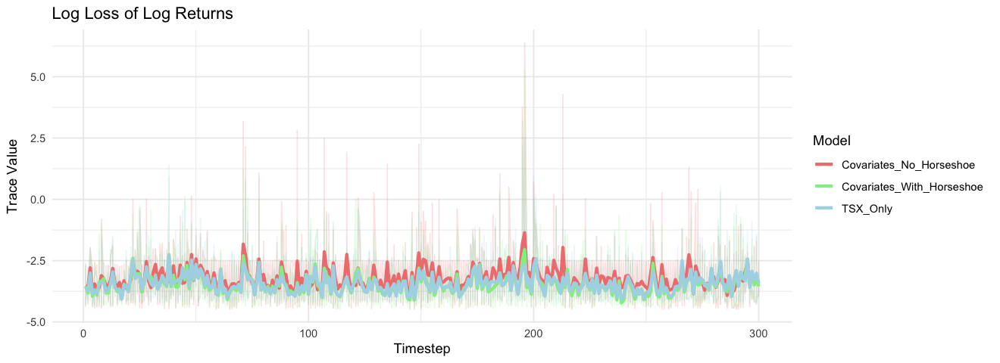

In [15]:
source("markets_functions.R")
plot_log_return_traces(
  tsx_only$log_return_traces,
  covariates_no_horseshoe_3s$log_return_traces,
  covariates_with_horseshoe_3s$log_return_traces,
  title = "Log Loss of Log Returns",
)

In [64]:
plot_log_return_traces(
  tsx_only = tsx_only$price_log_traces,
  covariates_no_horseshoe = covariates_no_horseshoe_3s$price_log_traces,
  covariates_with_horseshoe = covariates_with_horseshoe_4s$price_log_traces,
  title="Log Loss of Price",
)

ERROR: Error in data.frame(Timestep = seq_len(nrow(tsx_only$traces)), TSX_Only = rowMeans(tsx_only$traces, : arguments imply differing number of rows: 365, 300


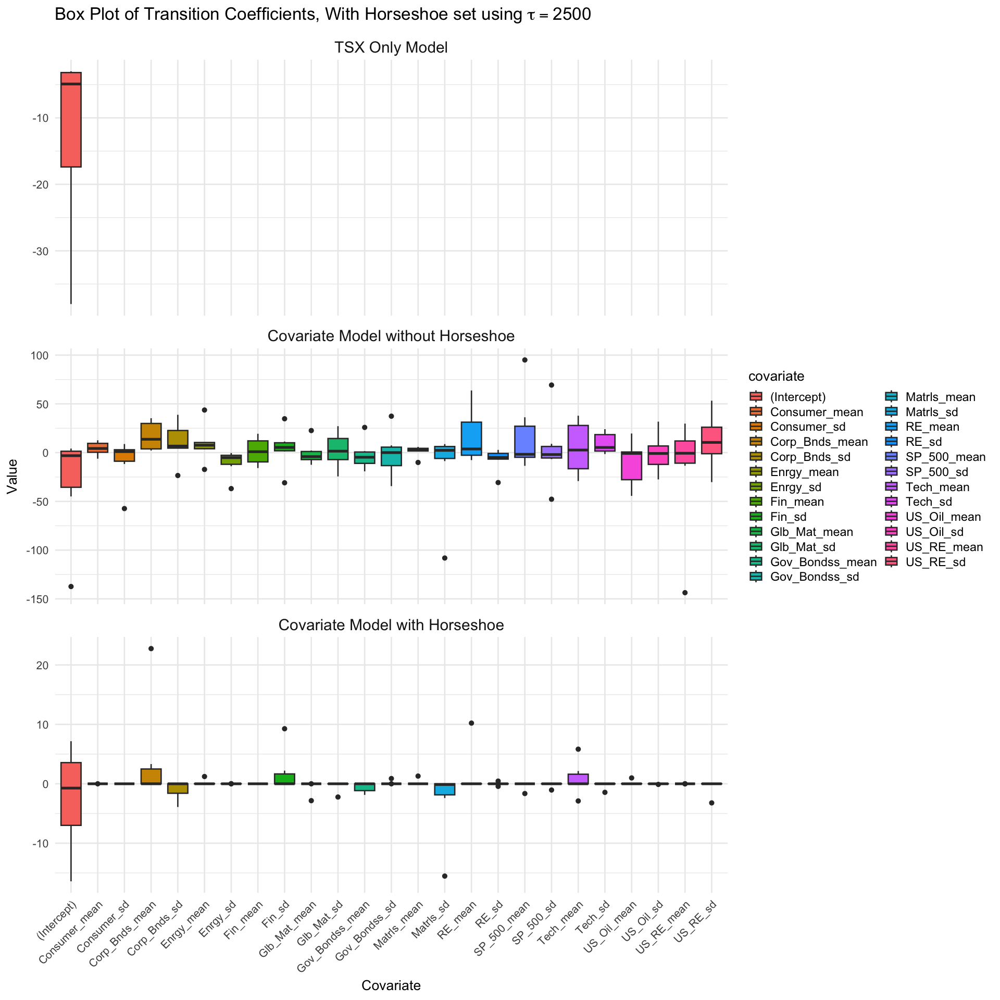

In [17]:
source("markets_functions.R")
hid_fe_long <- bind_rows(
  hid_fe_to_long(extract_hid_fe(tsx_only$hmms[[5]]), "TSX Only Model"),
  hid_fe_to_long(extract_hid_fe(covariates_no_horseshoe_3s$hmms[[5]]), "Covariate Model without Horseshoe"),
  hid_fe_to_long(extract_hid_fe(covariates_with_horseshoe_3s$hmms[[5]]), "Covariate Model with Horseshoe")
) %>%
  mutate(model = factor(model, levels = c("TSX Only Model", "Covariate Model without Horseshoe", "Covariate Model with Horseshoe")))

# Plot the boxplot
options(repr.plot.width = 16, repr.plot.height = 16)  # Adjust figure size
ggplot(hid_fe_long, aes(x = covariate, y = value, fill = covariate)) +
  geom_boxplot() +
  facet_wrap(~ model, ncol = 1, scales = "free_y") +
  labs(title = expression("Box Plot of Transition Coefficients, With Horseshoe set using " * tau == 2500), x = "Covariate", y = "Value") +
  theme_minimal(base_size = 16) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        strip.text = element_text(size = 18),
        plot.title = element_text(size = 20, face = "bold"),
        legend.title = element_text(size = 16),
        legend.text = element_text(size = 14)) 


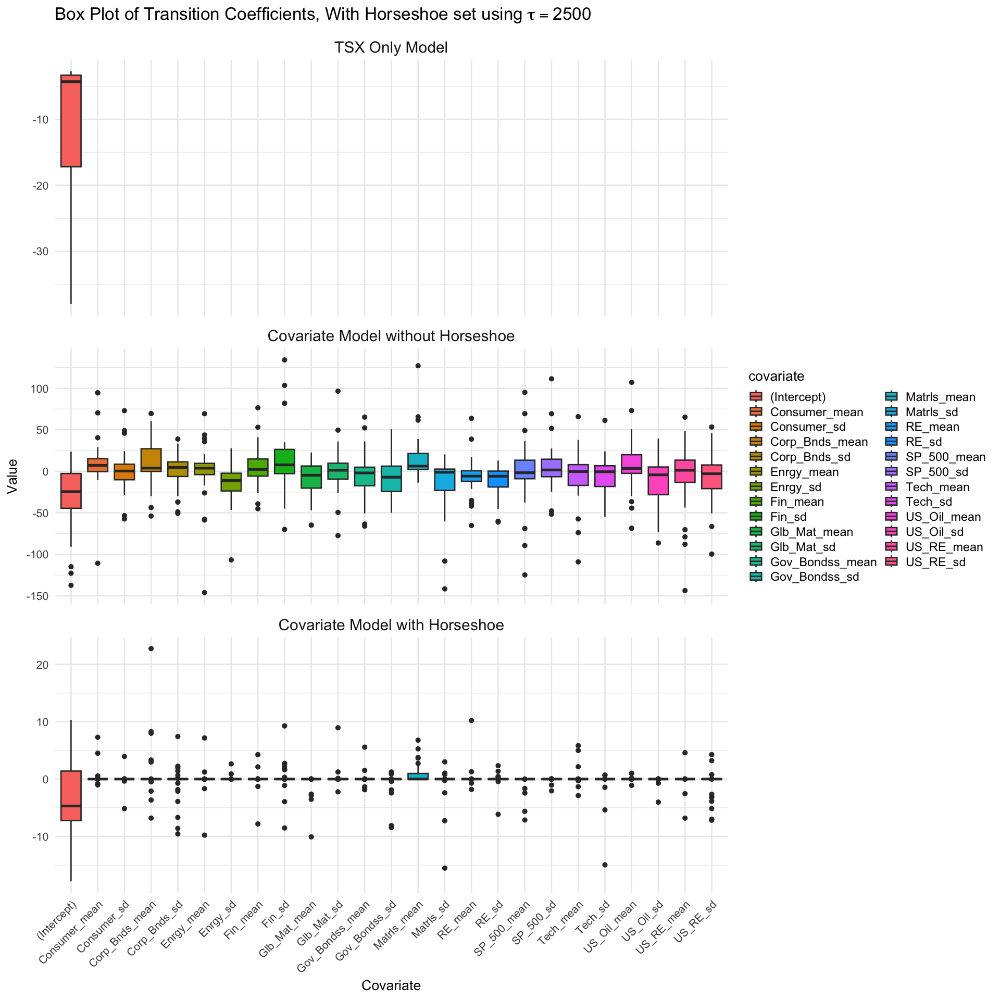

In [18]:
tsx_only_long <- do.call(rbind, lapply(seq_along(tsx_only$hmms), function(i) {
  hid_fe_to_long(extract_hid_fe(tsx_only$hmms[[i]]), "TSX Only Model")
}))
covariates_no_horseshoe_long <- do.call(rbind, lapply(seq_along(tsx_only$hmms), function(i) {
  hid_fe_to_long(extract_hid_fe(covariates_no_horseshoe_3s$hmms[[i]]), "Covariate Model without Horseshoe")
}))
covariates_with_horseshoe_long <- do.call(rbind, lapply(seq_along(tsx_only$hmms), function(i) {
  hid_fe_to_long(extract_hid_fe(covariates_with_horseshoe_3s$hmms[[i]]), "Covariate Model with Horseshoe")
}))

hid_fe_long <- bind_rows(
  tsx_only_long,
  covariates_no_horseshoe_long,
  covariates_with_horseshoe_long
) %>%
  mutate(model = factor(model, levels = c("TSX Only Model", "Covariate Model without Horseshoe", "Covariate Model with Horseshoe")))

# Plot the boxplot
options(repr.plot.width = 16, repr.plot.height = 16)  # Adjust figure size
ggplot(hid_fe_long, aes(x = covariate, y = value, fill = covariate)) +
  geom_boxplot() +
  facet_wrap(~ model, ncol = 1, scales = "free_y") +
  labs(title = expression("Box Plot of Transition Coefficients, With Horseshoe set using " * tau == 2500), x = "Covariate", y = "Value") +
  theme_minimal(base_size = 16) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        strip.text = element_text(size = 18),
        plot.title = element_text(size = 20, face = "bold"),
        legend.title = element_text(size = 16),
        legend.text = element_text(size = 14))


In [25]:
tsx_only[[1]]

[[1]]
#######################
## Observation model ##
#######################
+ TSX_Composite ~ norm(mean, sd) 
  * mean.state1 ~ 1
  * mean.state2 ~ 1
  * mean.state3 ~ 1
  * sd.state1 ~ 1
  * sd.state2 ~ 1
  * sd.state3 ~ 1
 
> Estimated observation parameters (t = 1):
                   state 1 state 2 state 3
TSX_Composite.mean  -0.002    0.00   0.001
TSX_Composite.sd     0.031    0.01   0.005

#########################
## State process model ##
#########################
        state 1 state 2 state 3
state 1       .      ~1      ~1
state 2      ~1       .      ~1
state 3      ~1      ~1       .

> Estimated transition probabilities (t = 1):
        state 1 state 2 state 3
state 1   0.962   0.038   0.000
state 2   0.007   0.964   0.028
state 3   0.000   0.023   0.977


[[2]]
#######################
## Observation model ##
#######################
+ TSX_Composite ~ norm(mean, sd) 
  * mean.state1 ~ 1
  * mean.state2 ~ 1
  * mean.state3 ~ 1
  * sd.state1 ~ 1
  * sd.state2 ~ 1
  * sd.